<div class="alert alert-block alert-info">
<h1> Analyse MTBLS19 peak table</h1>
</div>

---
# Table of contents
- [0 - Import modules](#0---Import-modules)
- [0 - Import data](#0---Import-data)
  - [Below are all the peak tables each batch of the MLBLS19 dataset](#Below-are-all-the-peak-tables-each-batch-of-the-MLBLS19-dataset)
- [1 - Preprocess data](#1---Preprocess-data)
  - [a - Transform data to adapt with input requirements](#a---Transform-data-to-adapt-with-input-requirements)
- [2 - Explore data](#2---Explore-data)
  - [a - Feature types](#a---Feature-types)
  - [b - Missing values exploration](#b---Missing-values-exploration)
  - [c - Correlation between features](#c---Correlation-between-features)
  - [d - Remove strongly correlated features (to potentially avoid issues during further analysis)](#d---Remove-strongly-correlated-features-(to-potentially-avoid-issues-during-further-analysis))
  - [e - PCA](#e---PCA)
  - [f - Target visualisation](#f---Target-visualisation)
  - [g - Feature visualisation](#g---Feature-visualisation)
- [3 - Impute missing values](#3---Impute-missing-values)
  - [a - Impute intensities with 1's](#a---Impute-intensities-with-1's)
  - [b - Impute intensities with half minimum value in features](#b---Impute-intensities-with-half-minimum-value-in-features)
- [4 - Transformations](#4---Transformations)
  - [a - log transformation](#a---log-transformation)
  - [b - Standard scale intensities](#b---Standard-scale-intensities)
- [5 - Dimensionality reduction](#5---Dimensionality-reduction)
  - [a - PCA then t-SNE](#a---PCA-then-t-SNE)
  - [b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$](#b---Feature-selection-keeping-all-features-with-ANOVA-pvalue-$\lt-\alpha-\hspace{0.39cm}$)
  - [c - Feature selection keeping a specific number of features](#c---Feature-selection-keeping-a-specific-number-of-features)
- [6 - Classification](#6---Classification)
  - [a - Launch pipeline with differently preprocessed dataframes](#a---Launch-pipeline-with-differently-preprocessed-dataframes)
- [7 - Clustering](#7---Clustering)
  - [a - Kmeans](#a---Kmeans)
  - [b - Affinity propagation](#b---Affinity-propagation)
  - [c - Hierarchical clustering](#c---Hierarchical-clustering)
---

# 0 - Import modules

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import re
pwd = ! pwd
pwd = re.sub('notebooks/', '', pwd[0])
pwd = '/'.join(pwd.split('/')[:-1]) + '/'
print(f'Working directory : {pwd}')

Working directory : /home/jovyan/work/


In [3]:
# Tune the visual settings for figures in seaborn
sns.set_context(
    "notebook", font_scale=1.2, rc={"figure.figsize": (15,8), "axes.titlesize": 15}
)

from matplotlib import rcParams

rcParams["figure.figsize"] = 15, 8

sns.set_theme(style="darkgrid")

In [4]:
import sys
sys.path.append(pwd + 'bin/')

In [135]:
import random
import os

# 0 - Import data

## Below are all the peak tables each batch of the MLBLS19 dataset

In [136]:
for file in os.listdir(pwd + 'data/MTBLS19/peak_tables'):
    
    print(file)
    df = pd.read_excel(pwd + 'data/MTBLS19/peak_tables/Exp1F_POS.xlsx')
    print(f'Shape : {df.shape}')
    
    print()

Exp1F_NEG.xlsx
Shape : (1527, 48)

Exp1F_POS.xlsx
Shape : (1527, 48)

Exp1R_NEG.xlsx
Shape : (1527, 48)

Exp1R_POS.xlsx
Shape : (1527, 48)

Exp2F_NEG.xlsx
Shape : (1527, 48)

Exp2F_POS.xlsx
Shape : (1527, 48)

Exp2R_NEG.xlsx
Shape : (1527, 48)

Exp2R_POS.xlsx
Shape : (1527, 48)



In [204]:
peakTable_MTBLS19_init = pd.read_excel(pwd + 'data/MTBLS19/peak_tables/Exp1F_NEG.xlsx')
print(f'Peak table shape : {peakTable_MTBLS19_init.shape}')
peakTable_MTBLS19_init.head()

Peak table shape : (884, 48)


,Unnamed: 0,mz,rt,Exp1F_CRR_1_NEG,Exp1F_CRR_2_NEG,Exp1F_CRR_3_NEG,Exp1F_CRR_4_NEG,Exp1F_CRR_5_NEG,Exp1F_CRR_6_NEG,Exp1F_CRR_7_NEG,...,Exp1F_HCC_11_NEG,Exp1F_HCC_12_NEG,Exp1F_HCC_13_NEG,Exp1F_HCC_14_NEG,Exp1F_HCC_15_NEG,Exp1F_HCC_16_NEG,Exp1F_HCC_17_NEG,Exp1F_HCC_18_NEG,Exp1F_HCC_19_NEG,Exp1F_HCC_20_NEG
0,Class 1_Cirrhosis 2_HCC,NaN,NaN,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,2.00,2.00,2.00,2.00,2.00,2.00,2.00,2.00,2.00,2.00
1,1,71.05,110.19,67.64,185.73,75.99,217.42,144.70,133.12,49.77,...,443.89,70.54,86.10,113.52,100.36,52.58,55.43,215.74,42.74,142.30
2,2,77.05,36.46,2907.41,3027.34,3309.05,2757.56,3327.96,3070.96,3061.76,...,2903.45,3176.90,3189.34,3334.41,3289.27,3160.71,3267.15,2956.72,2995.10,3352.01
3,3,87.01,30.76,137.83,170.21,156.74,235.60,253.15,165.78,122.46,...,114.76,148.92,141.85,206.49,161.32,137.47,219.19,219.82,135.28,204.93
4,4,88.05,30.77,208.10,181.24,200.04,230.03,213.01,190.99,206.48,...,188.77,235.15,182.69,248.76,214.29,222.85,203.36,238.08,207.03,197.07


In [205]:
metadata = pd.read_csv(pwd + 'data/MTBLS19/s_MTBLS19.txt', sep='\t')
print(f'Metadata shape : {metadata.shape}')
metadata.head()

Metadata shape : (360, 18)


,Source Name,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Organism part],Term Source REF.1,Term Accession Number.1,Protocol REF,Sample Name,Factor Value[Disease],Term Source REF.2,Term Accession Number.2,Factor Value[Batch],Term Source REF.3,Term Accession Number.3,Factor Value[Experiment],Term Source REF.4,Term Accession Number.4
0,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_1_POS,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
1,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_2_POS,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
2,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_3_POS,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
3,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_4_POS,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
4,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_5_POS,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN


### Below we will keep onky useful metadata

# 1 - Preprocess data

In [206]:
from explore_data_functions import *

## a - Transform data to adapt with input requirements

In [207]:
peakTable_MTBLS19 = peakTable_MTBLS19_init.copy()
peakTable_MTBLS19 = peakTable_MTBLS19.drop(0, axis=0)
peakTable_MTBLS19.index = range(peakTable_MTBLS19.shape[0])
peakTable_MTBLS19 = peakTable_MTBLS19.drop(peakTable_MTBLS19.columns[0], axis=1)
peakTable_MTBLS19.head()

,mz,rt,Exp1F_CRR_1_NEG,Exp1F_CRR_2_NEG,Exp1F_CRR_3_NEG,Exp1F_CRR_4_NEG,Exp1F_CRR_5_NEG,Exp1F_CRR_6_NEG,Exp1F_CRR_7_NEG,Exp1F_CRR_8_NEG,...,Exp1F_HCC_11_NEG,Exp1F_HCC_12_NEG,Exp1F_HCC_13_NEG,Exp1F_HCC_14_NEG,Exp1F_HCC_15_NEG,Exp1F_HCC_16_NEG,Exp1F_HCC_17_NEG,Exp1F_HCC_18_NEG,Exp1F_HCC_19_NEG,Exp1F_HCC_20_NEG
0,71.05,110.19,67.64,185.73,75.99,217.42,144.70,133.12,49.77,114.52,...,443.89,70.54,86.10,113.52,100.36,52.58,55.43,215.74,42.74,142.30
1,77.05,36.46,2907.41,3027.34,3309.05,2757.56,3327.96,3070.96,3061.76,2892.35,...,2903.45,3176.90,3189.34,3334.41,3289.27,3160.71,3267.15,2956.72,2995.10,3352.01
2,87.01,30.76,137.83,170.21,156.74,235.60,253.15,165.78,122.46,158.16,...,114.76,148.92,141.85,206.49,161.32,137.47,219.19,219.82,135.28,204.93
3,88.05,30.77,208.10,181.24,200.04,230.03,213.01,190.99,206.48,212.02,...,188.77,235.15,182.69,248.76,214.29,222.85,203.36,238.08,207.03,197.07
4,89.02,30.76,3503.37,4581.49,3438.49,4245.96,3978.36,1948.58,2409.30,2833.30,...,3396.75,3449.66,2357.62,3595.79,3168.30,2968.80,2794.54,3514.42,2867.65,3458.21


In [208]:
peakTable_MTBLS19.insert(0, '', peakTable_MTBLS19['mz'].astype(str) + '@' + peakTable_MTBLS19['rt'].astype(str))
peakTable_MTBLS19 = peakTable_MTBLS19.drop(['mz', 'rt'], axis=1)
peakTable_MTBLS19 = peakTable_MTBLS19.transpose()
peakTable_MTBLS19.columns = peakTable_MTBLS19.iloc[0, :]
peakTable_MTBLS19 = peakTable_MTBLS19.drop(peakTable_MTBLS19.index[0], axis=0)
peakTable_MTBLS19 = peakTable_MTBLS19.reset_index()
peakTable_MTBLS19 = peakTable_MTBLS19.rename(columns={'index': 'Sample Name'})
peakTable_MTBLS19.index = range(peakTable_MTBLS19.shape[0])
peakTable_MTBLS19

,Sample Name,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,Exp1F_CRR_1_NEG,67.64,2907.41,137.83,208.10,3503.37,176.11,131.10,1105.74,7158.54,...,239.84,1015.93,879.43,534.48,214.23,140.10,174.08,173.00,73.40,203.83
1,Exp1F_CRR_2_NEG,185.73,3027.34,170.21,181.24,4581.49,220.38,301.42,1104.52,7163.83,...,181.30,708.64,576.26,380.23,171.53,200.11,263.93,248.95,138.04,81.63
2,Exp1F_CRR_3_NEG,75.99,3309.05,156.74,200.04,3438.49,189.31,306.88,1063.13,7297.64,...,168.70,819.84,675.60,415.40,198.91,236.34,322.55,260.84,171.24,42.71
3,Exp1F_CRR_4_NEG,217.42,2757.56,235.60,230.03,4245.96,228.85,221.66,1176.57,6025.43,...,218.45,636.09,550.46,336.46,139.16,124.34,158.97,128.51,87.93,154.89
4,Exp1F_CRR_5_NEG,144.70,3327.96,253.15,213.01,3978.36,200.64,379.73,1010.09,6994.52,...,165.50,450.04,434.65,259.54,113.27,169.89,200.58,214.19,137.35,109.52
5,Exp1F_CRR_6_NEG,133.12,3070.96,165.78,190.99,1948.58,133.24,367.88,996.38,6829.30,...,127.68,574.89,522.93,330.22,146.28,249.99,293.14,281.93,172.42,213.53
6,Exp1F_CRR_7_NEG,49.77,3061.76,122.46,206.48,2409.30,115.67,268.19,1140.68,7010.16,...,180.88,839.84,723.74,434.07,197.63,199.35,272.63,203.37,127.88,116.21
7,Exp1F_CRR_8_NEG,114.52,2892.35,158.16,212.02,2833.30,156.00,293.38,1098.63,6623.27,...,205.52,694.29,656.58,381.56,154.61,183.58,211.07,189.62,101.44,226.42
8,Exp1F_CRR_9_NEG,111.32,3143.22,126.71,205.61,3219.11,176.47,362.33,986.31,6856.81,...,135.02,657.29,581.83,367.58,154.96,194.79,239.33,225.84,132.79,160.58
9,Exp1F_CRR_10_NEG,121.04,2867.86,171.35,169.98,3684.23,205.53,293.63,1041.01,7011.02,...,156.85,664.71,550.47,349.49,159.40,222.22,287.92,232.90,161.62,138.11


In [209]:
metadata_subset = metadata[metadata['Sample Name'].isin(peakTable_MTBLS19['Sample Name'])]
print(f'Metadata shape : {metadata_subset.shape}')
metadata_subset.head()

Metadata shape : (45, 18)


,Source Name,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Organism part],Term Source REF.1,Term Accession Number.1,Protocol REF,Sample Name,Factor Value[Disease],Term Source REF.2,Term Accession Number.2,Factor Value[Batch],Term Source REF.3,Term Accession Number.3,Factor Value[Experiment],Term Source REF.4,Term Accession Number.4
180,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_1_NEG,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
181,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_2_NEG,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
182,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_3_NEG,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
183,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_4_NEG,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
184,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_5_NEG,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN


In [210]:
peakTable = pd.merge(left=metadata_subset[['Sample Name', 'Factor Value[Disease]']].rename(columns={'Factor Value[Disease]': 'Disease'}),
                     right=peakTable_MTBLS19,
                     on='Sample Name')
print(f'Peak table shape : {peakTable.shape}')
peakTable.head()

Peak table shape : (45, 885)


,Sample Name,Disease,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,Exp1F_CRR_1_NEG,CRR,67.64,2907.41,137.83,208.10,3503.37,176.11,131.10,1105.74,...,239.84,1015.93,879.43,534.48,214.23,140.10,174.08,173.00,73.40,203.83
1,Exp1F_CRR_2_NEG,CRR,185.73,3027.34,170.21,181.24,4581.49,220.38,301.42,1104.52,...,181.30,708.64,576.26,380.23,171.53,200.11,263.93,248.95,138.04,81.63
2,Exp1F_CRR_3_NEG,CRR,75.99,3309.05,156.74,200.04,3438.49,189.31,306.88,1063.13,...,168.70,819.84,675.60,415.40,198.91,236.34,322.55,260.84,171.24,42.71
3,Exp1F_CRR_4_NEG,CRR,217.42,2757.56,235.60,230.03,4245.96,228.85,221.66,1176.57,...,218.45,636.09,550.46,336.46,139.16,124.34,158.97,128.51,87.93,154.89
4,Exp1F_CRR_5_NEG,CRR,144.70,3327.96,253.15,213.01,3978.36,200.64,379.73,1010.09,...,165.50,450.04,434.65,259.54,113.27,169.89,200.58,214.19,137.35,109.52


### Separate intensities (in dataframe <code>X</code>) and metadata (in dataframe <code>metadata</code>)

In [211]:
X = peakTable.iloc[:, 2:]
X

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,67.64,2907.41,137.83,208.10,3503.37,176.11,131.10,1105.74,7158.54,244.59,...,239.84,1015.93,879.43,534.48,214.23,140.10,174.08,173.00,73.40,203.83
1,185.73,3027.34,170.21,181.24,4581.49,220.38,301.42,1104.52,7163.83,228.48,...,181.30,708.64,576.26,380.23,171.53,200.11,263.93,248.95,138.04,81.63
2,75.99,3309.05,156.74,200.04,3438.49,189.31,306.88,1063.13,7297.64,225.35,...,168.70,819.84,675.60,415.40,198.91,236.34,322.55,260.84,171.24,42.71
3,217.42,2757.56,235.60,230.03,4245.96,228.85,221.66,1176.57,6025.43,232.58,...,218.45,636.09,550.46,336.46,139.16,124.34,158.97,128.51,87.93,154.89
4,144.70,3327.96,253.15,213.01,3978.36,200.64,379.73,1010.09,6994.52,230.66,...,165.50,450.04,434.65,259.54,113.27,169.89,200.58,214.19,137.35,109.52
5,133.12,3070.96,165.78,190.99,1948.58,133.24,367.88,996.38,6829.30,206.83,...,127.68,574.89,522.93,330.22,146.28,249.99,293.14,281.93,172.42,213.53
6,49.77,3061.76,122.46,206.48,2409.30,115.67,268.19,1140.68,7010.16,317.54,...,180.88,839.84,723.74,434.07,197.63,199.35,272.63,203.37,127.88,116.21
7,114.52,2892.35,158.16,212.02,2833.30,156.00,293.38,1098.63,6623.27,359.46,...,205.52,694.29,656.58,381.56,154.61,183.58,211.07,189.62,101.44,226.42
8,111.32,3143.22,126.71,205.61,3219.11,176.47,362.33,986.31,6856.81,238.56,...,135.02,657.29,581.83,367.58,154.96,194.79,239.33,225.84,132.79,160.58
9,121.04,2867.86,171.35,169.98,3684.23,205.53,293.63,1041.01,7011.02,199.69,...,156.85,664.71,550.47,349.49,159.40,222.22,287.92,232.90,161.62,138.11


In [212]:
metadata = peakTable.drop(X.columns, axis=1)
metadata

,Sample Name,Disease
0,Exp1F_CRR_1_NEG,CRR
1,Exp1F_CRR_2_NEG,CRR
2,Exp1F_CRR_3_NEG,CRR
3,Exp1F_CRR_4_NEG,CRR
4,Exp1F_CRR_5_NEG,CRR
5,Exp1F_CRR_6_NEG,CRR
6,Exp1F_CRR_7_NEG,CRR
7,Exp1F_CRR_8_NEG,CRR
8,Exp1F_CRR_9_NEG,CRR
9,Exp1F_CRR_10_NEG,CRR


# 2 - Explore data

## a - Feature types

######################################################################################################################################################
Data types : 
object    885
dtype: int64



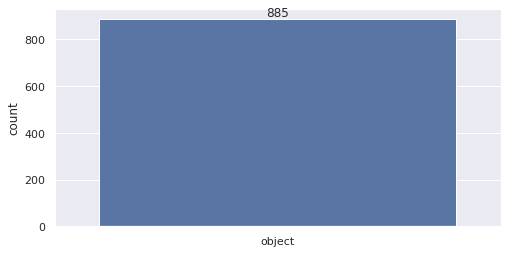

######################################################################################################################################################


In [213]:
plot_feature_types(peakTable)

### For further analysis, we prefer peak table intensites as float

In [214]:
peakTable[peakTable.columns[2:]] = peakTable[peakTable.columns[2:]].apply(pd.to_numeric, errors='coerce', axis=1)
peakTable

,Sample Name,Disease,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,Exp1F_CRR_1_NEG,CRR,67.64,2907.41,137.83,208.10,3503.37,176.11,131.10,1105.74,...,239.84,1015.93,879.43,534.48,214.23,140.10,174.08,173.00,73.40,203.83
1,Exp1F_CRR_2_NEG,CRR,185.73,3027.34,170.21,181.24,4581.49,220.38,301.42,1104.52,...,181.30,708.64,576.26,380.23,171.53,200.11,263.93,248.95,138.04,81.63
2,Exp1F_CRR_3_NEG,CRR,75.99,3309.05,156.74,200.04,3438.49,189.31,306.88,1063.13,...,168.70,819.84,675.60,415.40,198.91,236.34,322.55,260.84,171.24,42.71
3,Exp1F_CRR_4_NEG,CRR,217.42,2757.56,235.60,230.03,4245.96,228.85,221.66,1176.57,...,218.45,636.09,550.46,336.46,139.16,124.34,158.97,128.51,87.93,154.89
4,Exp1F_CRR_5_NEG,CRR,144.70,3327.96,253.15,213.01,3978.36,200.64,379.73,1010.09,...,165.50,450.04,434.65,259.54,113.27,169.89,200.58,214.19,137.35,109.52
5,Exp1F_CRR_6_NEG,CRR,133.12,3070.96,165.78,190.99,1948.58,133.24,367.88,996.38,...,127.68,574.89,522.93,330.22,146.28,249.99,293.14,281.93,172.42,213.53
6,Exp1F_CRR_7_NEG,CRR,49.77,3061.76,122.46,206.48,2409.30,115.67,268.19,1140.68,...,180.88,839.84,723.74,434.07,197.63,199.35,272.63,203.37,127.88,116.21
7,Exp1F_CRR_8_NEG,CRR,114.52,2892.35,158.16,212.02,2833.30,156.00,293.38,1098.63,...,205.52,694.29,656.58,381.56,154.61,183.58,211.07,189.62,101.44,226.42
8,Exp1F_CRR_9_NEG,CRR,111.32,3143.22,126.71,205.61,3219.11,176.47,362.33,986.31,...,135.02,657.29,581.83,367.58,154.96,194.79,239.33,225.84,132.79,160.58
9,Exp1F_CRR_10_NEG,CRR,121.04,2867.86,171.35,169.98,3684.23,205.53,293.63,1041.01,...,156.85,664.71,550.47,349.49,159.40,222.22,287.92,232.90,161.62,138.11


######################################################################################################################################################
Data types : 
float64    883
object       2
dtype: int64



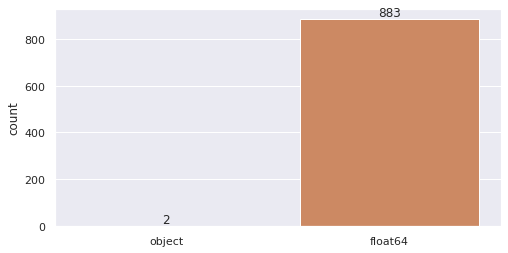

######################################################################################################################################################


In [215]:
plot_feature_types(peakTable)

### Re-subset X to have numerical values instead of object

In [216]:
X = peakTable.iloc[:, 2:]
X

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,67.64,2907.41,137.83,208.10,3503.37,176.11,131.10,1105.74,7158.54,244.59,...,239.84,1015.93,879.43,534.48,214.23,140.10,174.08,173.00,73.40,203.83
1,185.73,3027.34,170.21,181.24,4581.49,220.38,301.42,1104.52,7163.83,228.48,...,181.30,708.64,576.26,380.23,171.53,200.11,263.93,248.95,138.04,81.63
2,75.99,3309.05,156.74,200.04,3438.49,189.31,306.88,1063.13,7297.64,225.35,...,168.70,819.84,675.60,415.40,198.91,236.34,322.55,260.84,171.24,42.71
3,217.42,2757.56,235.60,230.03,4245.96,228.85,221.66,1176.57,6025.43,232.58,...,218.45,636.09,550.46,336.46,139.16,124.34,158.97,128.51,87.93,154.89
4,144.70,3327.96,253.15,213.01,3978.36,200.64,379.73,1010.09,6994.52,230.66,...,165.50,450.04,434.65,259.54,113.27,169.89,200.58,214.19,137.35,109.52
5,133.12,3070.96,165.78,190.99,1948.58,133.24,367.88,996.38,6829.30,206.83,...,127.68,574.89,522.93,330.22,146.28,249.99,293.14,281.93,172.42,213.53
6,49.77,3061.76,122.46,206.48,2409.30,115.67,268.19,1140.68,7010.16,317.54,...,180.88,839.84,723.74,434.07,197.63,199.35,272.63,203.37,127.88,116.21
7,114.52,2892.35,158.16,212.02,2833.30,156.00,293.38,1098.63,6623.27,359.46,...,205.52,694.29,656.58,381.56,154.61,183.58,211.07,189.62,101.44,226.42
8,111.32,3143.22,126.71,205.61,3219.11,176.47,362.33,986.31,6856.81,238.56,...,135.02,657.29,581.83,367.58,154.96,194.79,239.33,225.84,132.79,160.58
9,121.04,2867.86,171.35,169.98,3684.23,205.53,293.63,1041.01,7011.02,199.69,...,156.85,664.71,550.47,349.49,159.40,222.22,287.92,232.90,161.62,138.11


## b - Missing values exploration

In [217]:
plot_infos_missing_values(X)

######################################################################################################################################################
Considering None as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%

######################################################################################################################################################


### The function <code>plot_infos_missing_values</code> was developed to spot values equal to <code>NaN</code> by default. Here there are no NaNs but missing values can be in another form (0, 1, a specific string e.g. *'Unknown'* or *'NA'*, ...). We can pass argument <code>na_values</code> to specify the type of missing values in the peak table.

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 172
- Percent of missing values : 0.43%



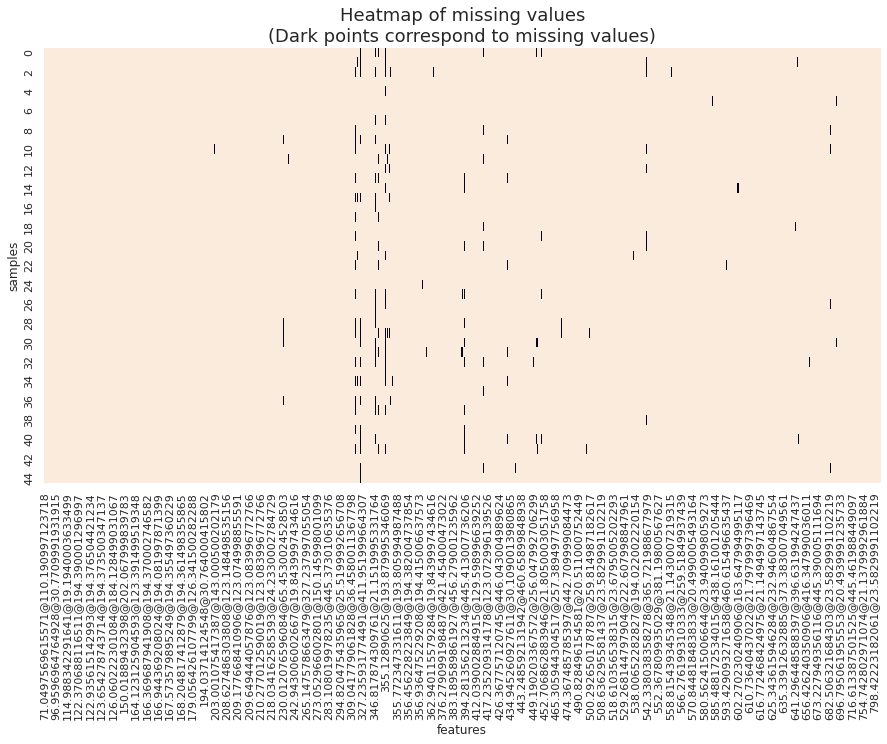

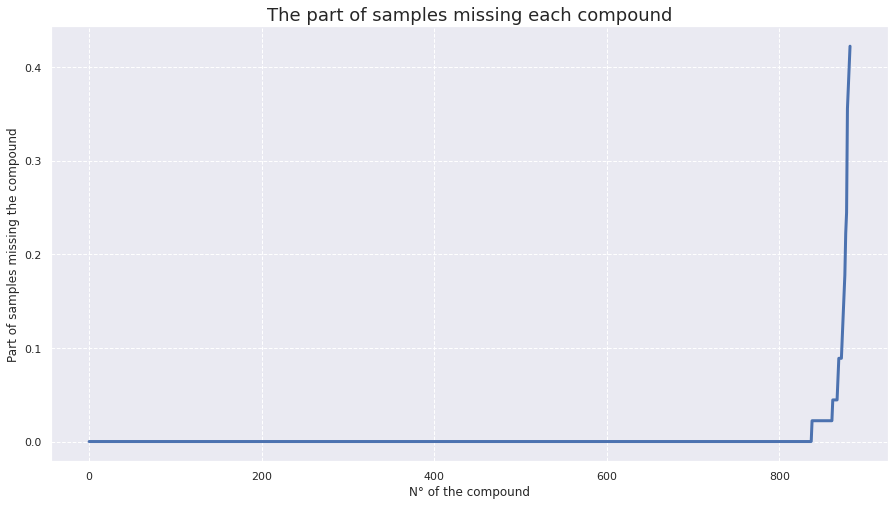



######################################################################################################################################################


In [218]:
plot_infos_missing_values(X, na_values=0)

## c - Correlation between features

######################################################################################################################################################


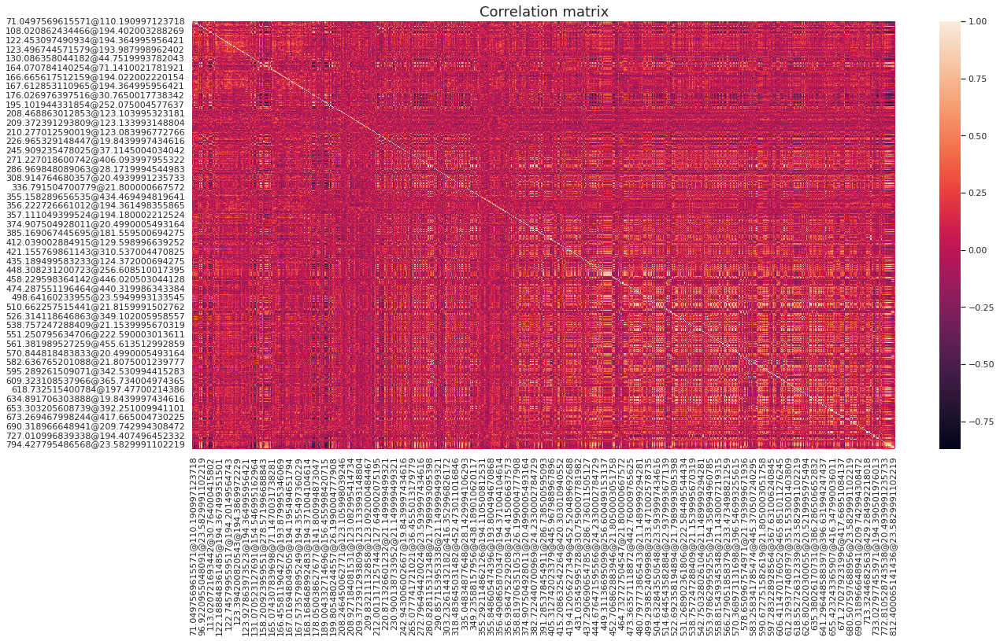

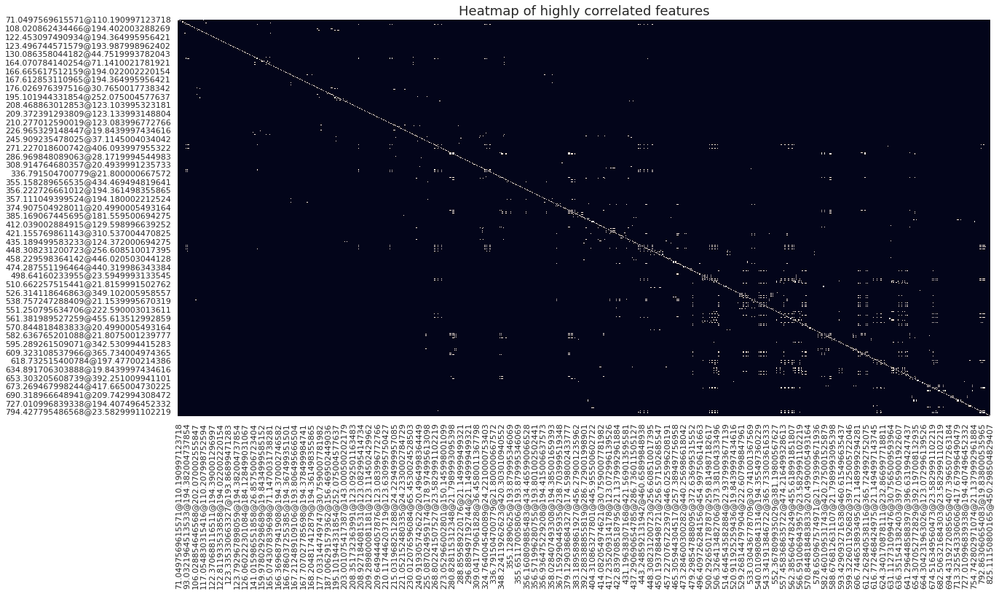



###################################################################################################################################################### 



In [219]:
plot_correlation_matrix(X, threshold=0.9)

## d - Remove strongly correlated features (to potentially avoid issues during further analysis)

In [220]:
X_remove_corr = remove_correlated_features(X)
X_remove_corr

Initial shape : (45, 883)
Final shape : (45, 659)

Time to compute : 00h00m00s

 ######################################################################################################################################################






,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,772.810528743538@20.4939991235733,782.834458017427@20.4705002903938,790.434304209193@23.5829991102219,792.863060654083@19.838000535965,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,67.64,2907.41,137.83,208.10,3503.37,176.11,131.10,1105.74,7158.54,244.59,...,75.48,108.21,333.05,239.84,214.23,140.10,174.08,173.00,73.40,203.83
1,185.73,3027.34,170.21,181.24,4581.49,220.38,301.42,1104.52,7163.83,228.48,...,50.23,80.25,272.56,181.30,171.53,200.11,263.93,248.95,138.04,81.63
2,75.99,3309.05,156.74,200.04,3438.49,189.31,306.88,1063.13,7297.64,225.35,...,59.30,73.38,232.09,168.70,198.91,236.34,322.55,260.84,171.24,42.71
3,217.42,2757.56,235.60,230.03,4245.96,228.85,221.66,1176.57,6025.43,232.58,...,65.74,66.80,239.36,218.45,139.16,124.34,158.97,128.51,87.93,154.89
4,144.70,3327.96,253.15,213.01,3978.36,200.64,379.73,1010.09,6994.52,230.66,...,60.70,95.43,179.96,165.50,113.27,169.89,200.58,214.19,137.35,109.52
5,133.12,3070.96,165.78,190.99,1948.58,133.24,367.88,996.38,6829.30,206.83,...,47.64,78.37,227.80,127.68,146.28,249.99,293.14,281.93,172.42,213.53
6,49.77,3061.76,122.46,206.48,2409.30,115.67,268.19,1140.68,7010.16,317.54,...,73.49,87.67,309.69,180.88,197.63,199.35,272.63,203.37,127.88,116.21
7,114.52,2892.35,158.16,212.02,2833.30,156.00,293.38,1098.63,6623.27,359.46,...,56.41,74.38,267.92,205.52,154.61,183.58,211.07,189.62,101.44,226.42
8,111.32,3143.22,126.71,205.61,3219.11,176.47,362.33,986.31,6856.81,238.56,...,58.42,60.23,256.57,135.02,154.96,194.79,239.33,225.84,132.79,160.58
9,121.04,2867.86,171.35,169.98,3684.23,205.53,293.63,1041.01,7011.02,199.69,...,54.66,80.80,229.93,156.85,159.40,222.22,287.92,232.90,161.62,138.11


In [221]:
peakTable_remove_corr = pd.concat([metadata, X_remove_corr], axis=1)
peakTable_remove_corr

,Sample Name,Disease,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,...,772.810528743538@20.4939991235733,782.834458017427@20.4705002903938,790.434304209193@23.5829991102219,792.863060654083@19.838000535965,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,Exp1F_CRR_1_NEG,CRR,67.64,2907.41,137.83,208.10,3503.37,176.11,131.10,1105.74,...,75.48,108.21,333.05,239.84,214.23,140.10,174.08,173.00,73.40,203.83
1,Exp1F_CRR_2_NEG,CRR,185.73,3027.34,170.21,181.24,4581.49,220.38,301.42,1104.52,...,50.23,80.25,272.56,181.30,171.53,200.11,263.93,248.95,138.04,81.63
2,Exp1F_CRR_3_NEG,CRR,75.99,3309.05,156.74,200.04,3438.49,189.31,306.88,1063.13,...,59.30,73.38,232.09,168.70,198.91,236.34,322.55,260.84,171.24,42.71
3,Exp1F_CRR_4_NEG,CRR,217.42,2757.56,235.60,230.03,4245.96,228.85,221.66,1176.57,...,65.74,66.80,239.36,218.45,139.16,124.34,158.97,128.51,87.93,154.89
4,Exp1F_CRR_5_NEG,CRR,144.70,3327.96,253.15,213.01,3978.36,200.64,379.73,1010.09,...,60.70,95.43,179.96,165.50,113.27,169.89,200.58,214.19,137.35,109.52
5,Exp1F_CRR_6_NEG,CRR,133.12,3070.96,165.78,190.99,1948.58,133.24,367.88,996.38,...,47.64,78.37,227.80,127.68,146.28,249.99,293.14,281.93,172.42,213.53
6,Exp1F_CRR_7_NEG,CRR,49.77,3061.76,122.46,206.48,2409.30,115.67,268.19,1140.68,...,73.49,87.67,309.69,180.88,197.63,199.35,272.63,203.37,127.88,116.21
7,Exp1F_CRR_8_NEG,CRR,114.52,2892.35,158.16,212.02,2833.30,156.00,293.38,1098.63,...,56.41,74.38,267.92,205.52,154.61,183.58,211.07,189.62,101.44,226.42
8,Exp1F_CRR_9_NEG,CRR,111.32,3143.22,126.71,205.61,3219.11,176.47,362.33,986.31,...,58.42,60.23,256.57,135.02,154.96,194.79,239.33,225.84,132.79,160.58
9,Exp1F_CRR_10_NEG,CRR,121.04,2867.86,171.35,169.98,3684.23,205.53,293.63,1041.01,...,54.66,80.80,229.93,156.85,159.40,222.22,287.92,232.90,161.62,138.11


## e - PCA

In [222]:
import cimcb_lite as cb

In [223]:
cb.plot.pca(X, pcx=1, pcy=2, group_label=peakTable['Disease'])

/opt/conda/lib/python3.10/site-packages/bokeh/util/deprecation.py:75: BokehDeprecationWarning:

'legend' keyword is deprecated, use explicit 'legend_label', 'legend_field', or 'legend_group' keywords instead

/opt/conda/lib/python3.10/site-packages/bokeh/util/deprecation.py:75: BokehDeprecationWarning:

'legend' keyword is deprecated, use explicit 'legend_label', 'legend_field', or 'legend_group' keywords instead



Loading BokehJS ...

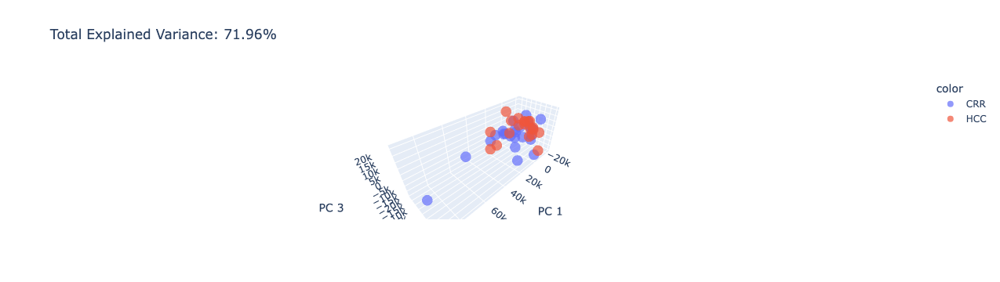

In [224]:
PCA_3D(X, peakTable, 'Disease')

## f - Target visualisation

In [225]:
target = peakTable['Disease']

######################################################################################################################################################
Target values : 
CRR    25
HCC    20
Name: Disease, dtype: int64



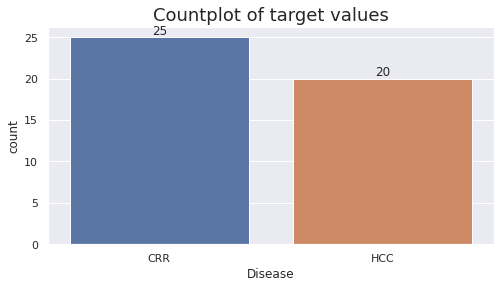

###################################################################################################################################################### 



In [226]:
plot_target(target)

## g - Feature visualisation

The following visualisations show the distributions of the chosen features of the peak table.

### We can set the number of features with <code>nb_features</code> parameter, which will plot the first N features of the peak table.

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

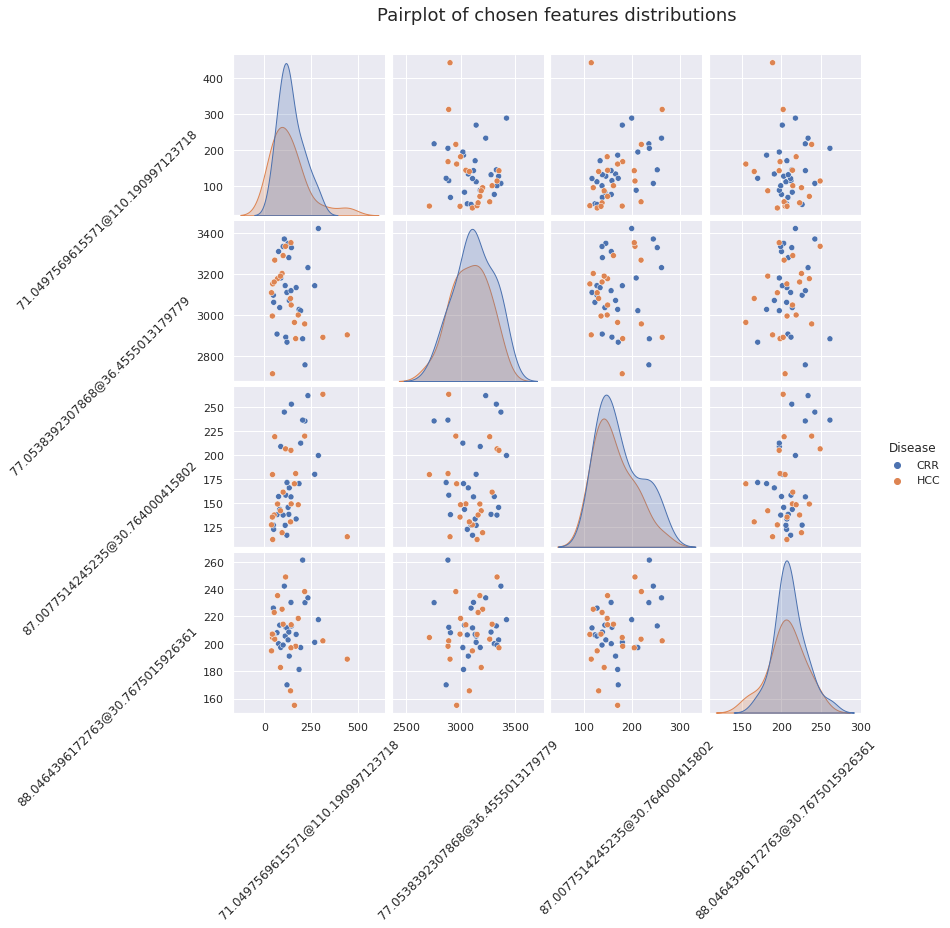

###################################################################################################################################################### 



In [227]:
plot_pairplot_distributions(X, target, nb_features=4)

### We can also set the list of features we want to plot with <code>list_features</code> parameter.

In [228]:
n_features = 3

list_features = random.sample(X.columns.tolist(), n_features)
list_features

['102.98359994506@26.8485000729561',
 '393.277610731012@445.418500900269',
 '210.842808752406@23.5829991102219']

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

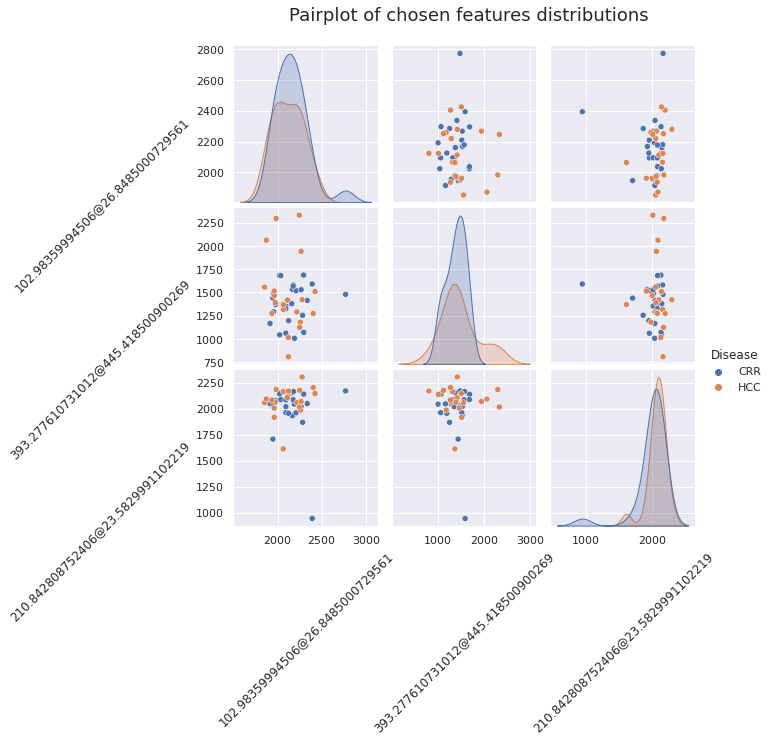

###################################################################################################################################################### 



In [229]:
plot_pairplot_distributions(X, target, list_features=list_features)

### Here we can observe histogram and boxplot for each chosen feature

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


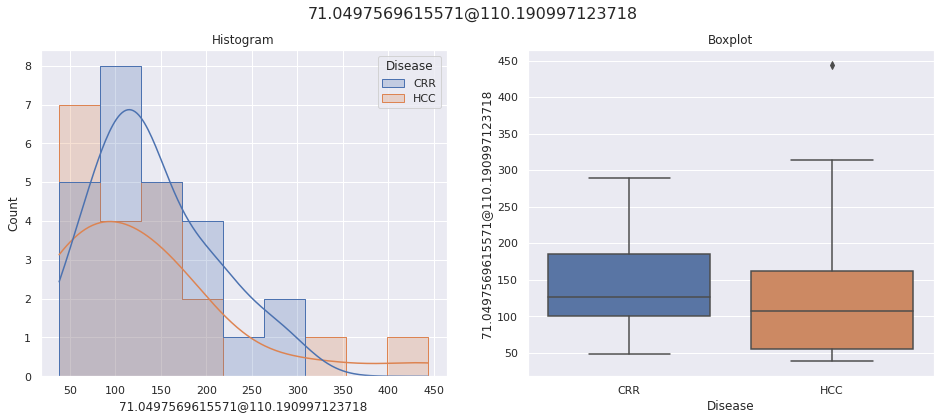

------------------------------------------------------------------------------------------------------------------------


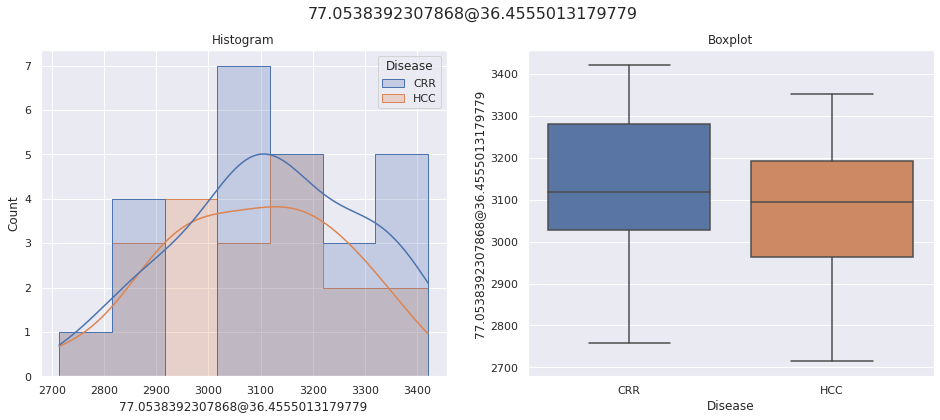

------------------------------------------------------------------------------------------------------------------------


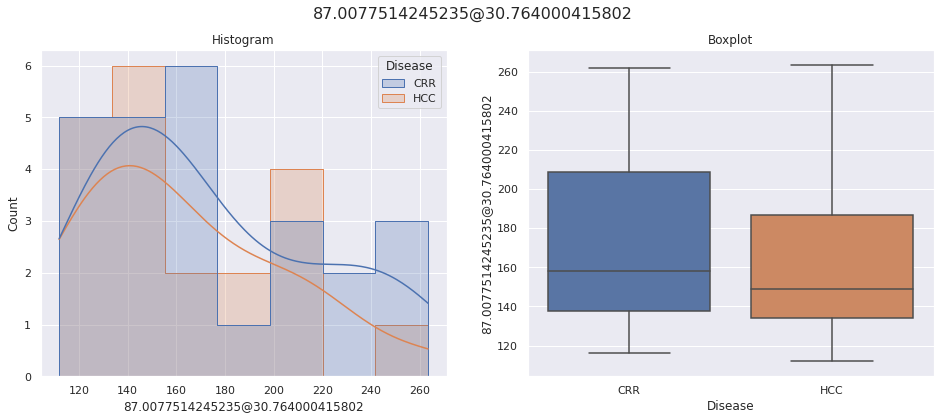

------------------------------------------------------------------------------------------------------------------------


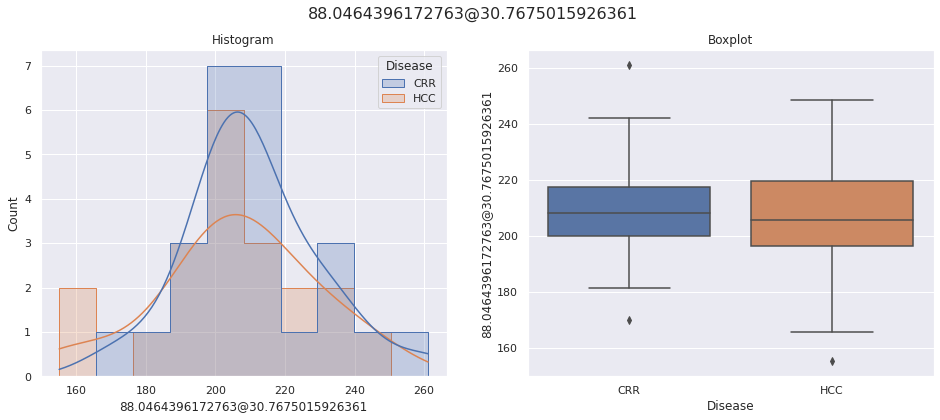

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [230]:
plot_hist_boxplot_distributions(X, target, nb_features=4)

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


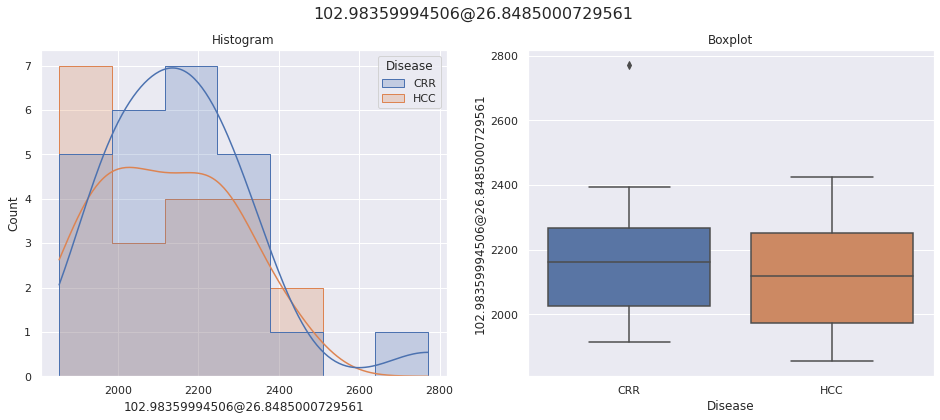

------------------------------------------------------------------------------------------------------------------------


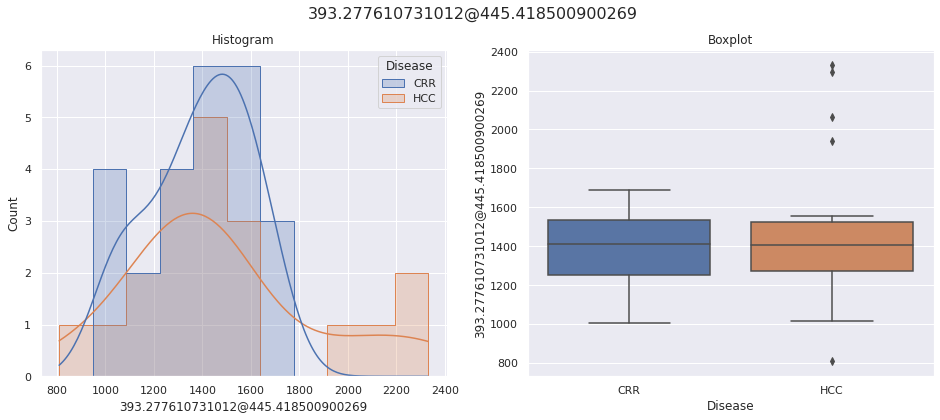

------------------------------------------------------------------------------------------------------------------------


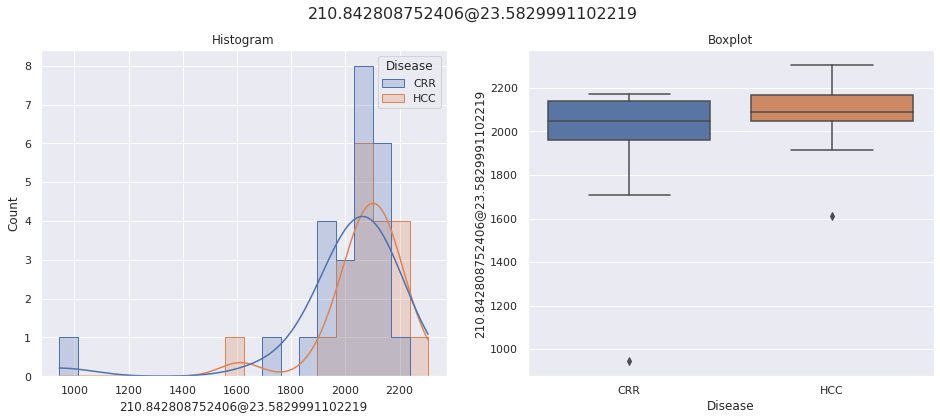

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [231]:
plot_hist_boxplot_distributions(X, target, list_features=list_features)

# 3 - Impute missing values

In [232]:
from missing_value_imputation_functions import *

### We observed before that missing values are here 0's. For further analysis, we prefer to avoid having 0's for mathematical purposes, we can replace these zeros by other values

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 172
- Percent of missing values : 0.43%



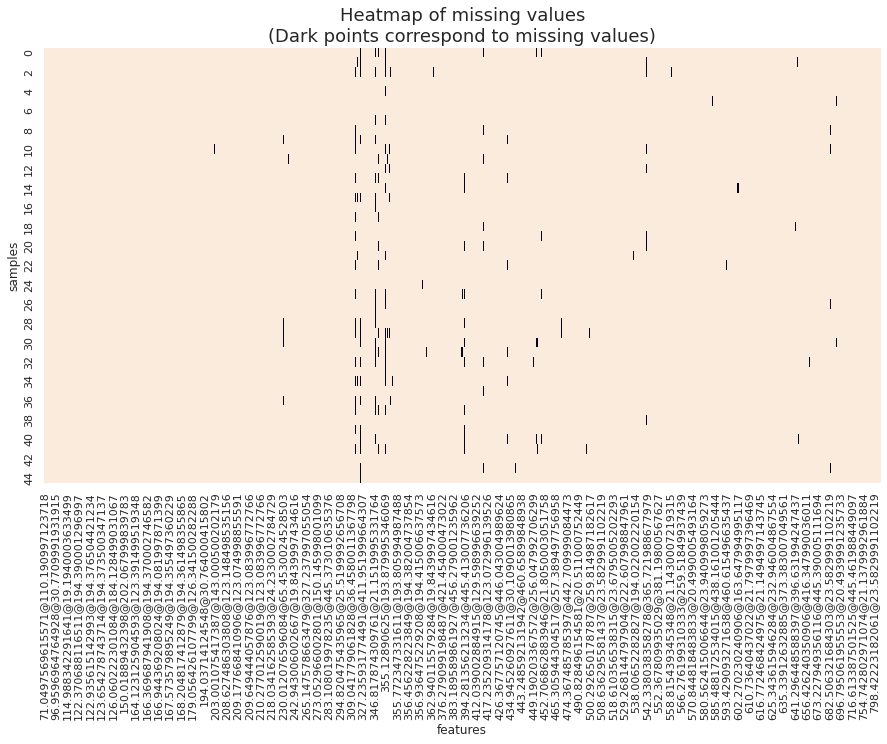

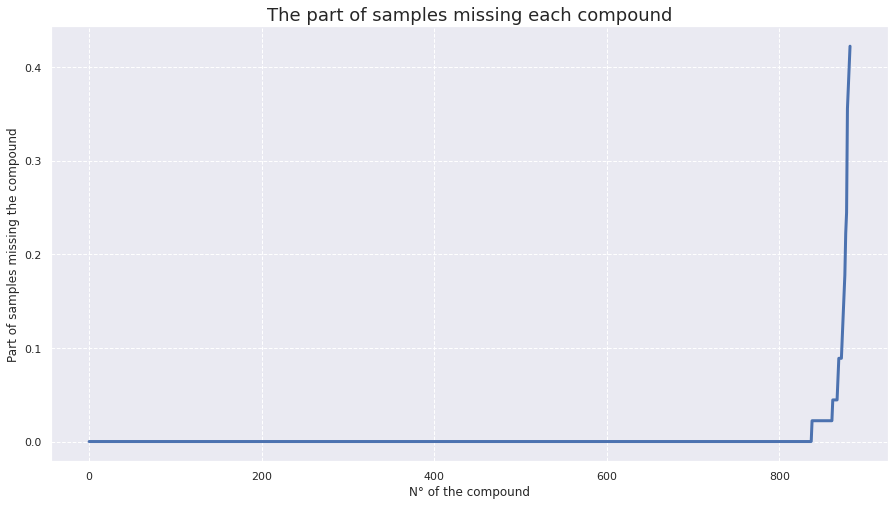



######################################################################################################################################################


In [233]:
plot_infos_missing_values(X, na_values=0)

### Set 0 to NaN to then impute with chosen imputer

In [234]:
X_with_Nan = X.copy()
X_with_Nan[X_with_Nan == 0] = np.nan

## a - Impute intensities with 1's

In [235]:
X_imp_1 = const_imputer(X_with_Nan, 1)
X_imp_1

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,67.64,2907.41,137.83,208.10,3503.37,176.11,131.10,1105.74,7158.54,244.59,...,239.84,1015.93,879.43,534.48,214.23,140.10,174.08,173.00,73.40,203.83
1,185.73,3027.34,170.21,181.24,4581.49,220.38,301.42,1104.52,7163.83,228.48,...,181.30,708.64,576.26,380.23,171.53,200.11,263.93,248.95,138.04,81.63
2,75.99,3309.05,156.74,200.04,3438.49,189.31,306.88,1063.13,7297.64,225.35,...,168.70,819.84,675.60,415.40,198.91,236.34,322.55,260.84,171.24,42.71
3,217.42,2757.56,235.60,230.03,4245.96,228.85,221.66,1176.57,6025.43,232.58,...,218.45,636.09,550.46,336.46,139.16,124.34,158.97,128.51,87.93,154.89
4,144.70,3327.96,253.15,213.01,3978.36,200.64,379.73,1010.09,6994.52,230.66,...,165.50,450.04,434.65,259.54,113.27,169.89,200.58,214.19,137.35,109.52
5,133.12,3070.96,165.78,190.99,1948.58,133.24,367.88,996.38,6829.30,206.83,...,127.68,574.89,522.93,330.22,146.28,249.99,293.14,281.93,172.42,213.53
6,49.77,3061.76,122.46,206.48,2409.30,115.67,268.19,1140.68,7010.16,317.54,...,180.88,839.84,723.74,434.07,197.63,199.35,272.63,203.37,127.88,116.21
7,114.52,2892.35,158.16,212.02,2833.30,156.00,293.38,1098.63,6623.27,359.46,...,205.52,694.29,656.58,381.56,154.61,183.58,211.07,189.62,101.44,226.42
8,111.32,3143.22,126.71,205.61,3219.11,176.47,362.33,986.31,6856.81,238.56,...,135.02,657.29,581.83,367.58,154.96,194.79,239.33,225.84,132.79,160.58
9,121.04,2867.86,171.35,169.98,3684.23,205.53,293.63,1041.01,7011.02,199.69,...,156.85,664.71,550.47,349.49,159.40,222.22,287.92,232.90,161.62,138.11


## b - Impute intensities with half minimum value in features

In [236]:
X_imp_halfmin = half_min_imputer(X_with_Nan)
X_imp_halfmin

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,67.64,2907.41,137.83,208.10,3503.37,176.11,131.10,1105.74,7158.54,244.59,...,239.84,1015.93,879.43,534.48,214.23,140.10,174.08,173.00,73.40,203.83
1,185.73,3027.34,170.21,181.24,4581.49,220.38,301.42,1104.52,7163.83,228.48,...,181.30,708.64,576.26,380.23,171.53,200.11,263.93,248.95,138.04,81.63
2,75.99,3309.05,156.74,200.04,3438.49,189.31,306.88,1063.13,7297.64,225.35,...,168.70,819.84,675.60,415.40,198.91,236.34,322.55,260.84,171.24,42.71
3,217.42,2757.56,235.60,230.03,4245.96,228.85,221.66,1176.57,6025.43,232.58,...,218.45,636.09,550.46,336.46,139.16,124.34,158.97,128.51,87.93,154.89
4,144.70,3327.96,253.15,213.01,3978.36,200.64,379.73,1010.09,6994.52,230.66,...,165.50,450.04,434.65,259.54,113.27,169.89,200.58,214.19,137.35,109.52
5,133.12,3070.96,165.78,190.99,1948.58,133.24,367.88,996.38,6829.30,206.83,...,127.68,574.89,522.93,330.22,146.28,249.99,293.14,281.93,172.42,213.53
6,49.77,3061.76,122.46,206.48,2409.30,115.67,268.19,1140.68,7010.16,317.54,...,180.88,839.84,723.74,434.07,197.63,199.35,272.63,203.37,127.88,116.21
7,114.52,2892.35,158.16,212.02,2833.30,156.00,293.38,1098.63,6623.27,359.46,...,205.52,694.29,656.58,381.56,154.61,183.58,211.07,189.62,101.44,226.42
8,111.32,3143.22,126.71,205.61,3219.11,176.47,362.33,986.31,6856.81,238.56,...,135.02,657.29,581.83,367.58,154.96,194.79,239.33,225.84,132.79,160.58
9,121.04,2867.86,171.35,169.98,3684.23,205.53,293.63,1041.01,7011.02,199.69,...,156.85,664.71,550.47,349.49,159.40,222.22,287.92,232.90,161.62,138.11


### We can check that there is no more missing values in the imputed peak tables

In [237]:
plot_infos_missing_values(X_imp_1, na_values=0)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%

######################################################################################################################################################


In [238]:
plot_infos_missing_values(X_imp_halfmin, na_values=0)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%

######################################################################################################################################################


# 4 - Transformations

In [239]:
from normalisation_scaling_functions import *

## a - log transformation

In [240]:
X_imp_halfmin_log = normPeakTable(X_imp_halfmin, 'log10', based='metabolite')
X_imp_halfmin_log

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,1.83,3.46,2.14,2.32,3.54,2.25,2.12,3.04,3.85,2.39,...,2.38,3.01,2.94,2.73,2.33,2.15,2.24,2.24,1.87,2.31
1,2.27,3.48,2.23,2.26,3.66,2.34,2.48,3.04,3.86,2.36,...,2.26,2.85,2.76,2.58,2.23,2.30,2.42,2.40,2.14,1.91
2,1.88,3.52,2.20,2.30,3.54,2.28,2.49,3.03,3.86,2.35,...,2.23,2.91,2.83,2.62,2.30,2.37,2.51,2.42,2.23,1.63
3,2.34,3.44,2.37,2.36,3.63,2.36,2.35,3.07,3.78,2.37,...,2.34,2.80,2.74,2.53,2.14,2.09,2.20,2.11,1.94,2.19
4,2.16,3.52,2.40,2.33,3.60,2.30,2.58,3.00,3.84,2.36,...,2.22,2.65,2.64,2.41,2.05,2.23,2.30,2.33,2.14,2.04
5,2.12,3.49,2.22,2.28,3.29,2.12,2.57,3.00,3.83,2.32,...,2.11,2.76,2.72,2.52,2.17,2.40,2.47,2.45,2.24,2.33
6,1.70,3.49,2.09,2.31,3.38,2.06,2.43,3.06,3.85,2.50,...,2.26,2.92,2.86,2.64,2.30,2.30,2.44,2.31,2.11,2.07
7,2.06,3.46,2.20,2.33,3.45,2.19,2.47,3.04,3.82,2.56,...,2.31,2.84,2.82,2.58,2.19,2.26,2.32,2.28,2.01,2.35
8,2.05,3.50,2.10,2.31,3.51,2.25,2.56,2.99,3.84,2.38,...,2.13,2.82,2.76,2.57,2.19,2.29,2.38,2.35,2.12,2.21
9,2.08,3.46,2.23,2.23,3.57,2.31,2.47,3.02,3.85,2.30,...,2.20,2.82,2.74,2.54,2.20,2.35,2.46,2.37,2.21,2.14


## b - Standard scale intensities

In [241]:
X_imp_halfmin_log_std = normPeakTable(X_imp_halfmin_log, 'autoscaling', based='metabolites')
X_imp_halfmin_log_std

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,-0.94,-1.16,-0.72,0.02,0.38,-0.11,-2.46,0.18,0.42,0.03,...,1.22,0.97,0.99,0.98,0.52,-1.25,-1.50,-0.96,-2.09,0.86
1,0.80,-0.43,0.15,-1.35,1.81,1.28,0.27,0.17,0.43,-0.32,...,0.14,0.12,-0.03,0.15,0.12,0.31,0.35,0.69,0.30,-1.14
2,-0.74,1.17,-0.19,-0.37,0.28,0.34,0.33,-0.16,0.64,-0.39,...,-0.13,0.46,0.35,0.36,0.39,1.03,1.24,0.91,1.12,-2.56
3,1.07,-2.11,1.49,1.02,1.40,1.51,-0.74,0.71,-1.52,-0.23,...,0.86,-0.13,-0.14,-0.15,-0.25,-1.77,-1.91,-2.32,-1.41,0.26
4,0.37,1.27,1.79,0.26,1.06,0.70,1.03,-0.61,0.16,-0.27,...,-0.21,-0.95,-0.72,-0.79,-0.62,-0.41,-0.87,0.01,0.28,-0.50
5,0.23,-0.17,0.04,-0.83,-2.74,-1.84,0.93,-0.73,-0.11,-0.83,...,-1.21,-0.37,-0.27,-0.20,-0.16,1.28,0.82,1.26,1.14,0.96
6,-1.47,-0.23,-1.21,-0.05,-1.61,-2.71,-0.11,0.45,0.19,1.36,...,0.14,0.52,0.52,0.47,0.38,0.29,0.50,-0.23,0.01,-0.37
7,-0.03,-1.25,-0.15,0.21,-0.75,-0.86,0.18,0.12,-0.45,1.99,...,0.63,0.07,0.28,0.15,-0.06,-0.07,-0.64,-0.55,-0.87,1.09
8,-0.08,0.25,-1.07,-0.10,-0.07,-0.10,0.88,-0.81,-0.06,-0.10,...,-0.99,-0.06,-0.01,0.06,-0.06,0.19,-0.08,0.25,0.15,0.34
9,0.06,-1.41,0.18,-1.99,0.65,0.84,0.19,-0.35,0.19,-1.01,...,-0.41,-0.03,-0.14,-0.06,-0.01,0.77,0.74,0.39,0.90,0.01


# 5 - Dimensionality reduction

In [242]:
from dimensionality_reduction_functions import *

## a - PCA then t-SNE

### The point of this step is to reduce dimensionality, argument <code>part_explained_variance</code> can be changed to set the part of initial explained variance we want to keep after reduction. We can also set the <code>n_components</code> argument to keep a specific number of PCA components.

In [243]:
target = peakTable['Disease']

#################################################################################################### 



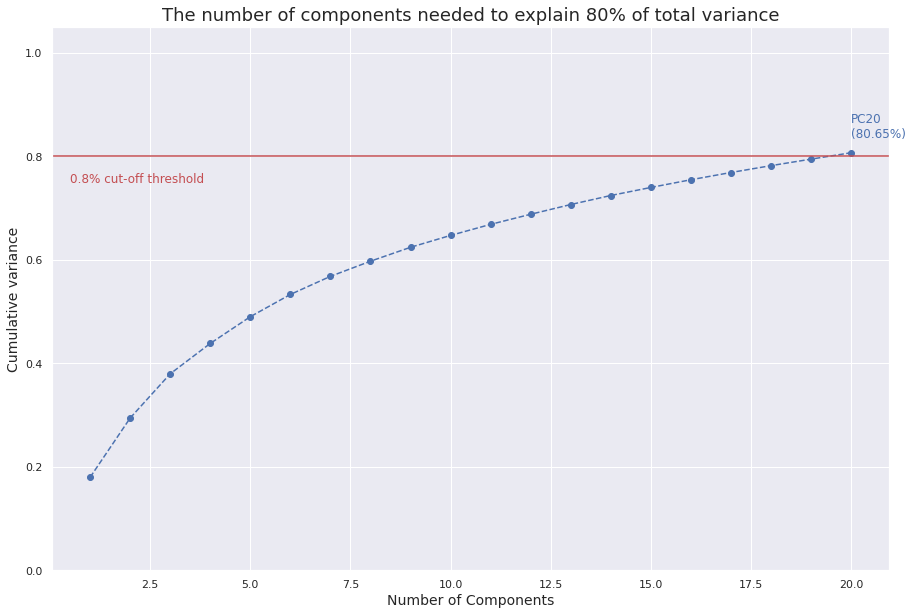

Initial number of dimension : 883
Final number of dimension : 20


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,-12.08,-6.02,8.34,-5.05,0.83,-5.94,-4.81,-7.55,11.15,3.89,-0.81,-6.00,3.13,-0.92,-0.18,-3.45,-2.25,4.60,1.96,-0.31
1,0.77,-0.97,-5.33,-2.18,6.68,2.40,8.01,-8.16,3.04,2.08,5.53,-3.89,-3.31,-1.79,-3.74,-0.55,8.61,0.07,5.15,-5.06
2,-1.04,23.83,4.51,8.59,-13.76,-0.81,14.33,0.65,-5.59,-0.34,-0.71,-4.21,-4.61,-2.29,-0.61,-1.35,2.29,0.46,-3.83,2.70
3,3.75,-12.20,2.62,15.65,-3.72,0.63,-10.92,-11.67,5.30,3.90,-6.11,-1.53,-0.10,9.88,-6.39,7.95,-0.47,-1.14,-3.04,-2.14
4,4.85,-7.99,-3.33,-1.66,-0.04,2.67,6.25,-6.25,-8.83,12.18,5.85,2.29,3.08,3.91,-5.27,-1.80,-2.20,-5.81,-5.61,4.12
5,8.25,4.17,-16.01,-8.95,-6.50,-7.71,-9.40,-3.73,-6.22,0.03,-5.62,4.53,-4.59,-2.69,-4.29,-4.13,-4.72,-3.60,1.77,0.50
6,-5.96,1.76,7.52,2.59,-9.68,-1.59,4.88,-6.59,-5.43,-8.17,-6.67,6.00,4.82,1.59,0.32,-3.96,-1.21,5.38,1.96,-2.43
7,-0.14,0.40,3.19,8.90,-4.46,1.07,-2.10,-2.07,0.88,-7.66,1.27,0.83,2.20,-4.76,0.04,2.65,-3.88,0.89,7.15,-0.27
8,-3.55,-6.74,4.68,-6.58,3.56,6.27,-2.90,1.43,-4.85,-5.78,-5.39,-1.78,-1.74,1.01,-2.19,-0.54,2.67,5.23,-3.48,4.77
9,-0.13,-8.79,-2.68,-4.51,-4.44,2.44,-3.22,-0.12,0.57,-1.46,3.79,5.58,-7.48,3.60,4.69,1.22,5.92,-1.99,5.23,-0.24



 #################################################################################################### 

Time to compute t-SNE (input dataframe of shape (45, 20)) : 0.19 seconds

----------------------------------------------------------------------------------------------------


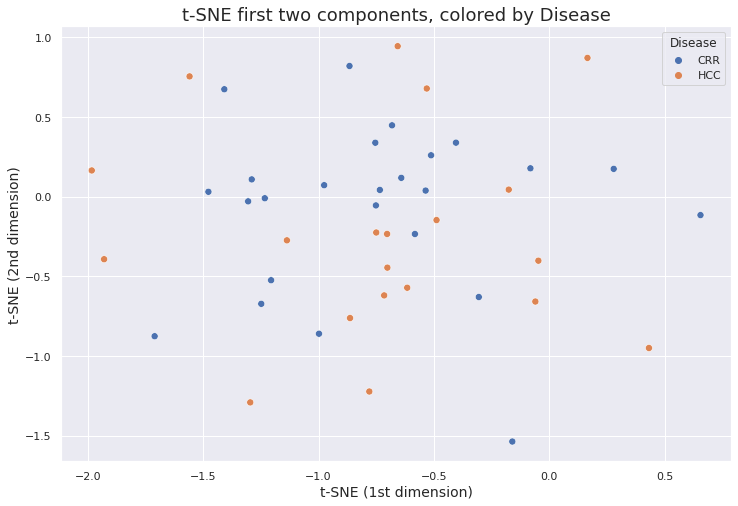

----------------------------------------------------------------------------------------------------


,tSNE1,tSNE2
0,-0.31,-0.63
1,-1.00,-0.86
2,0.28,0.17
3,0.65,-0.12
4,-1.71,-0.88
5,-1.41,0.67
6,-1.48,0.03
7,-0.98,0.07
8,-0.68,0.45
9,-1.29,0.11


In [244]:
print(100 * '#', '\n')

matrix = X_imp_halfmin_log_std.copy()

X_imp_halfmin_log_std_PCA, explained_variance = perform_PCA(matrix, part_explained_variance=0.8)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {explained_variance.shape[0]}')
display(X_imp_halfmin_log_std_PCA)

print('\n', 100 * '#', '\n')

n_components = 2
X_imp_halfmin_log_std_PCA_tSNE = perform_tSNE(X_imp_halfmin_log_std_PCA, metadata=metadata, n_components=n_components, targets_plot=[target.name])
display(X_imp_halfmin_log_std_PCA_tSNE)

## b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$

In [245]:
#target = peakTable['Disease']
matrix = X_imp_halfmin_log_std.copy()

X_imp_halfmin_log_std_fs_anova, feature_scores = select_best_features(matrix, target, alpha=0.01)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_log_std_fs_anova)

Initial number of dimension : 883
Final number of dimension : 38


,features,f_scores,p_values
485,431.184773860108@310.531497001648,38.66,0.00
475,421.155769861143@310.537004470825,31.52,0.00
495,437.290690654785@286.736011505127,16.64,0.00
441,392.288388855819@286.729001998901,16.05,0.00
440,391.285378454911@286.738500595093,15.81,0.00
414,367.159290445935@238.703999519348,15.34,0.00
497,438.293472801898@286.729001998901,14.61,0.00
114,166.665617512159@194.022002220154,14.35,0.00
403,357.207541790366@245.70499420166,13.35,0.00
535,459.272444518472@286.726498603821,12.75,0.00


,431.184773860108@310.531497001648,421.155769861143@310.537004470825,437.290690654785@286.736011505127,392.288388855819@286.729001998901,391.285378454911@286.738500595093,367.159290445935@238.703999519348,438.293472801898@286.729001998901,166.665617512159@194.022002220154,357.207541790366@245.70499420166,459.272444518472@286.726498603821,...,450.313619867887@256.600499153137,230.995888988074@157.151005268097,265.147578663479@327.237997055054,167.832304646582@194.381003379822,404.310863277801@445.955500602722,471.242372311675@245.032496452332,403.307137813155@445.934987068176,450.415453832933@256.616992950439,713.3244682563@429.284992218018,682.902684407396@417.664003372192
0,1.03,1.18,-1.69,-1.60,-1.84,0.00,-1.25,-0.34,-1.41,-1.84,...,-2.24,-0.91,-0.69,0.22,-0.07,-1.25,-0.20,-1.81,0.32,-0.42
1,0.69,0.85,1.13,1.16,1.13,0.02,1.16,1.03,1.04,1.34,...,0.82,0.21,0.50,0.50,-0.59,0.96,-0.52,0.97,0.65,0.78
2,-1.25,-1.62,-0.85,-0.60,-0.94,0.48,-1.30,0.65,-1.20,-0.83,...,-0.31,-0.06,-0.42,1.19,0.49,-0.43,0.53,-0.50,-1.92,-1.82
3,1.26,1.32,0.64,0.73,0.65,0.65,0.64,-0.49,1.22,0.64,...,0.51,1.17,-0.66,0.42,-0.24,1.11,-0.17,0.84,1.45,-0.79
4,0.60,0.71,0.37,0.48,0.47,-1.15,0.40,0.15,1.03,0.33,...,0.68,0.44,0.65,-0.33,-0.33,0.07,-0.31,1.06,1.05,-0.14
5,0.74,0.98,0.49,0.54,0.52,-0.57,0.42,1.10,0.20,0.41,...,0.44,-0.68,0.15,-0.26,-1.44,-0.32,-1.53,0.91,-0.19,0.98
6,0.70,0.35,-0.31,-0.23,-0.27,0.55,-0.33,1.19,0.64,-0.37,...,-0.45,0.20,-0.90,0.77,0.63,-0.30,0.56,-0.60,0.63,-0.02
7,0.65,0.60,0.91,0.89,0.89,-0.07,0.94,0.58,0.51,1.00,...,-0.10,0.46,0.54,0.48,-0.12,0.51,0.01,-0.09,-0.78,1.48
8,1.04,1.06,0.94,0.94,0.91,-1.86,0.93,1.50,0.85,1.02,...,0.32,0.38,1.04,0.37,-0.21,0.42,-0.22,0.04,0.83,-1.21
9,0.49,0.65,0.40,0.33,0.42,-1.68,0.43,-0.15,0.37,0.20,...,0.59,0.43,0.38,-2.67,0.44,0.17,0.41,0.58,1.45,1.89


## c - Feature selection keeping a specific number of features

### Keeping 10 features

In [246]:
#target = peakTable['Disease']
matrix = X_imp_halfmin_log_std.copy()

X_imp_halfmin_log_std_fs_nb_10, feature_scores = select_best_features(matrix, target, k=10)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_log_std_fs_nb_10)

Initial number of dimension : 883
Final number of dimension : 10


,features,f_scores,p_values
485,431.184773860108@310.531497001648,38.66,0.00
475,421.155769861143@310.537004470825,31.52,0.00
495,437.290690654785@286.736011505127,16.64,0.00
441,392.288388855819@286.729001998901,16.05,0.00
440,391.285378454911@286.738500595093,15.81,0.00
414,367.159290445935@238.703999519348,15.34,0.00
497,438.293472801898@286.729001998901,14.61,0.00
114,166.665617512159@194.022002220154,14.35,0.00
403,357.207541790366@245.70499420166,13.35,0.00
535,459.272444518472@286.726498603821,12.75,0.00


,431.184773860108@310.531497001648,421.155769861143@310.537004470825,437.290690654785@286.736011505127,392.288388855819@286.729001998901,391.285378454911@286.738500595093,367.159290445935@238.703999519348,438.293472801898@286.729001998901,166.665617512159@194.022002220154,357.207541790366@245.70499420166,459.272444518472@286.726498603821
0,1.03,1.18,-1.69,-1.60,-1.84,0.00,-1.25,-0.34,-1.41,-1.84
1,0.69,0.85,1.13,1.16,1.13,0.02,1.16,1.03,1.04,1.34
2,-1.25,-1.62,-0.85,-0.60,-0.94,0.48,-1.30,0.65,-1.20,-0.83
3,1.26,1.32,0.64,0.73,0.65,0.65,0.64,-0.49,1.22,0.64
4,0.60,0.71,0.37,0.48,0.47,-1.15,0.40,0.15,1.03,0.33
5,0.74,0.98,0.49,0.54,0.52,-0.57,0.42,1.10,0.20,0.41
6,0.70,0.35,-0.31,-0.23,-0.27,0.55,-0.33,1.19,0.64,-0.37
7,0.65,0.60,0.91,0.89,0.89,-0.07,0.94,0.58,0.51,1.00
8,1.04,1.06,0.94,0.94,0.91,-1.86,0.93,1.50,0.85,1.02
9,0.49,0.65,0.40,0.33,0.42,-1.68,0.43,-0.15,0.37,0.20


######################################################################################################################################################


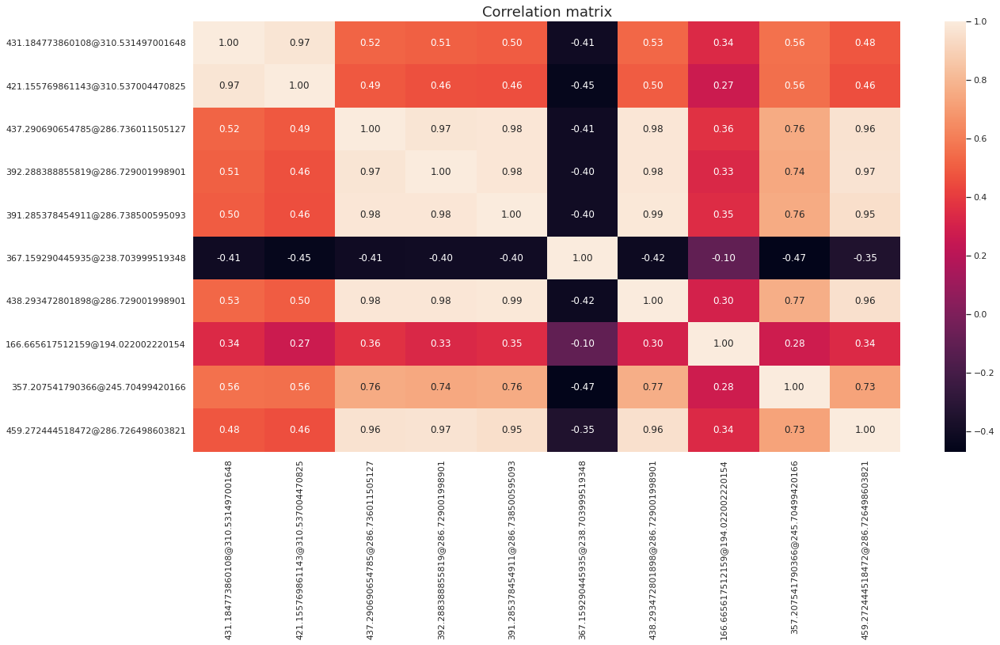

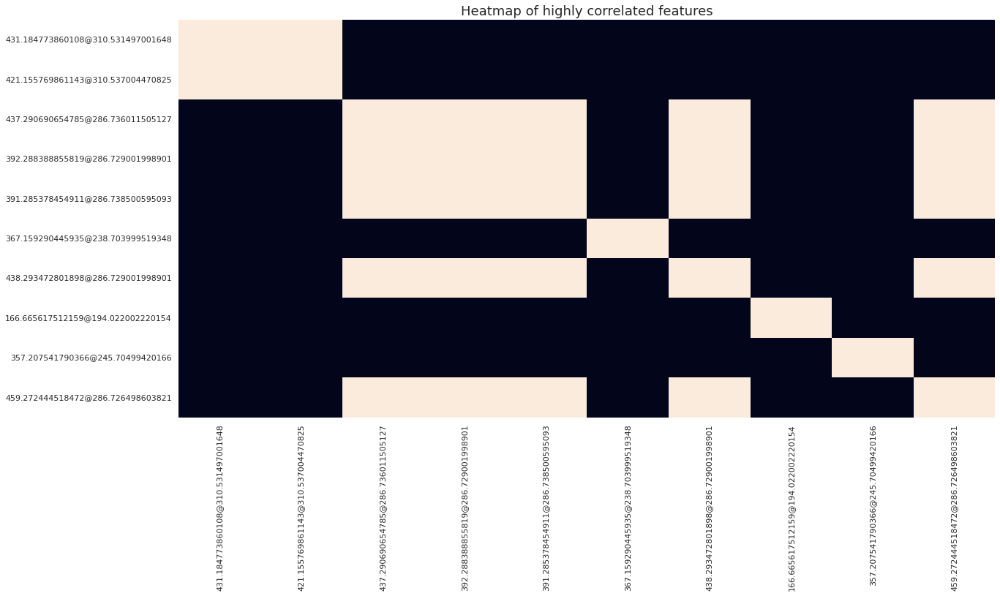



###################################################################################################################################################### 



In [247]:
matrix = pd.concat([target, X_imp_halfmin_log_std_fs_nb_10], axis=1)
plot_correlation_matrix(matrix, threshold=0.8, annot=True, fmt='.2f')

### Keeping 5 features

In [248]:
#target = peakTable['Disease']
matrix = X_imp_halfmin_log_std.copy()

X_imp_halfmin_log_std_fs_nb_5, feature_scores = select_best_features(matrix, target, k=5)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_log_std_fs_nb_5)

Initial number of dimension : 883
Final number of dimension : 5


,features,f_scores,p_values
485,431.184773860108@310.531497001648,38.66,0.00
475,421.155769861143@310.537004470825,31.52,0.00
495,437.290690654785@286.736011505127,16.64,0.00
441,392.288388855819@286.729001998901,16.05,0.00
440,391.285378454911@286.738500595093,15.81,0.00


,431.184773860108@310.531497001648,421.155769861143@310.537004470825,437.290690654785@286.736011505127,392.288388855819@286.729001998901,391.285378454911@286.738500595093
0,1.03,1.18,-1.69,-1.60,-1.84
1,0.69,0.85,1.13,1.16,1.13
2,-1.25,-1.62,-0.85,-0.60,-0.94
3,1.26,1.32,0.64,0.73,0.65
4,0.60,0.71,0.37,0.48,0.47
5,0.74,0.98,0.49,0.54,0.52
6,0.70,0.35,-0.31,-0.23,-0.27
7,0.65,0.60,0.91,0.89,0.89
8,1.04,1.06,0.94,0.94,0.91
9,0.49,0.65,0.40,0.33,0.42


######################################################################################################################################################


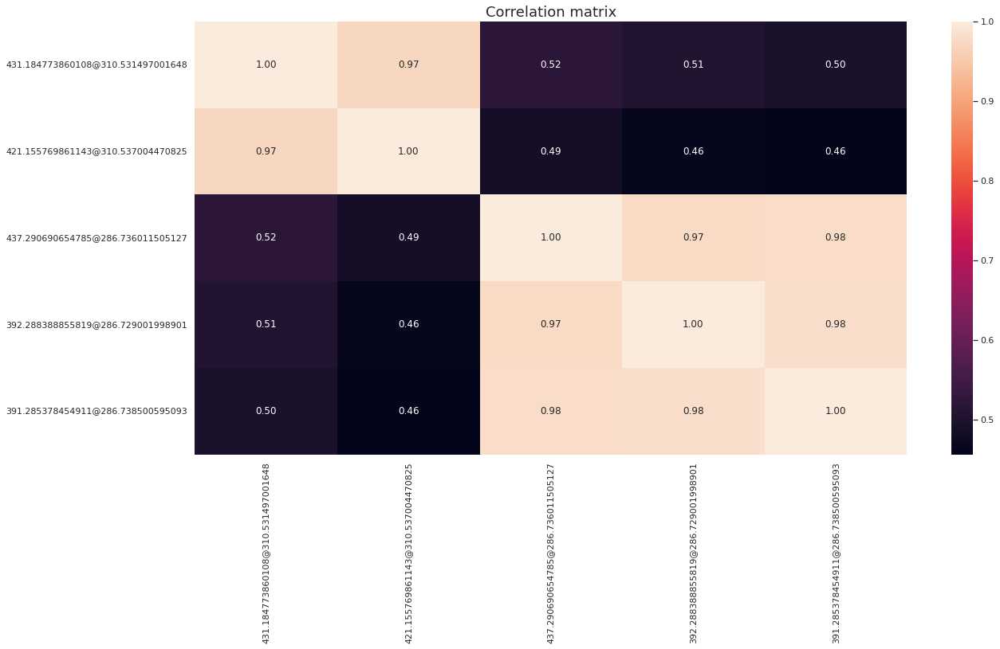

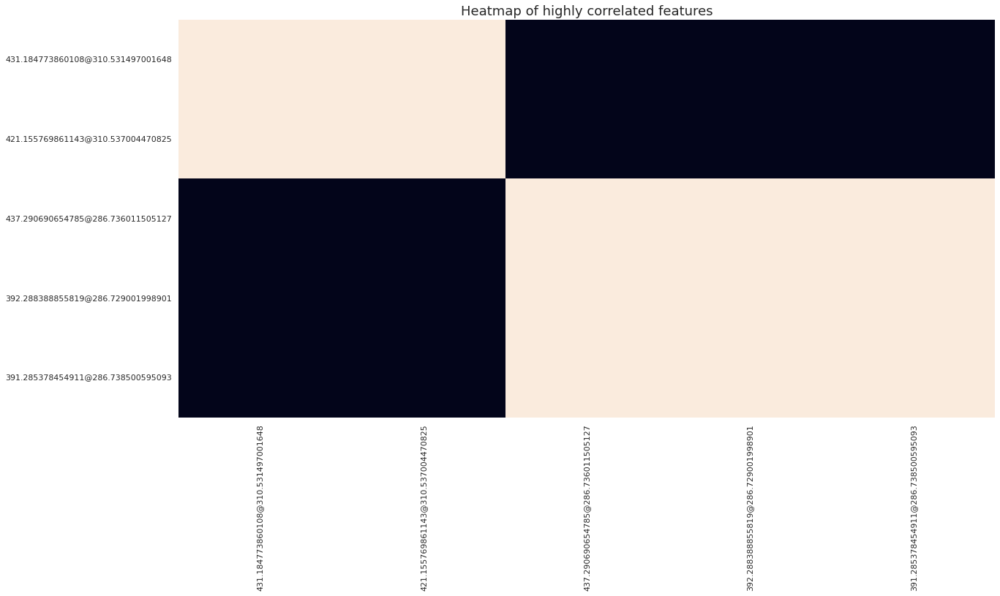



###################################################################################################################################################### 



In [249]:
matrix = pd.concat([target, X_imp_halfmin_log_std_fs_nb_5], axis=1)
plot_correlation_matrix(matrix, threshold=0.8, annot=True, fmt='.2f')

### Keeping 1 feature

In [250]:
#target = peakTable['Disease']
matrix = X_imp_halfmin_log_std.copy()

X_imp_halfmin_log_std_fs_nb_1, feature_scores = select_best_features(matrix, target, k=1)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_log_std_fs_nb_1)

Initial number of dimension : 883
Final number of dimension : 1


,features,f_scores,p_values
485,431.184773860108@310.531497001648,38.66,0.00


,431.184773860108@310.531497001648
0,1.03
1,0.69
2,-1.25
3,1.26
4,0.60
5,0.74
6,0.70
7,0.65
8,1.04
9,0.49


#### For further analysis, we have the following reduced dataframes :
- <code>X_imp_halfmin_log_std_PCA</code> : reduced peak table with PCA keeping 95% of initial explained variance
- <code>X_imp_halfmin_log_std_PCA_tSNE</code> : reduced peak table with PCA as before + t-SNE reduction to keep only 2 components
- <code>X_imp_halfmin_log_std_fs_anova</code> : reduced peak table by keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$
- <code>peakTable_Agilent_imp_std_fs_nb_N</code> : reduced peak table by keeping a specific number of features (with $N=\{1;5;10\}$ here)

# 6 - Classification

In [251]:
from classification_functions import *

In [252]:
from sklearn.linear_model import RidgeClassifier, LogisticRegression, SGDClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

## a - Launch pipeline with differently preprocessed dataframes

In [253]:
target

0     CRR
1     CRR
2     CRR
3     CRR
4     CRR
5     CRR
6     CRR
7     CRR
8     CRR
9     CRR
10    CRR
11    CRR
12    CRR
13    CRR
14    CRR
15    CRR
16    CRR
17    CRR
18    CRR
19    CRR
20    CRR
21    CRR
22    CRR
23    CRR
24    CRR
25    HCC
26    HCC
27    HCC
28    HCC
29    HCC
30    HCC
31    HCC
32    HCC
33    HCC
34    HCC
35    HCC
36    HCC
37    HCC
38    HCC
39    HCC
40    HCC
41    HCC
42    HCC
43    HCC
44    HCC
Name: Disease, dtype: object

### with <code>X_imp_halfmin_log_std_PCA</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,3,2
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.60,0.67,5.00
HCC,0.60,0.75,0.67,4.00
accuracy,0.67,0.67,0.67,0.67
macro avg,0.68,0.68,0.67,9.00
weighted avg,0.68,0.67,0.67,9.00


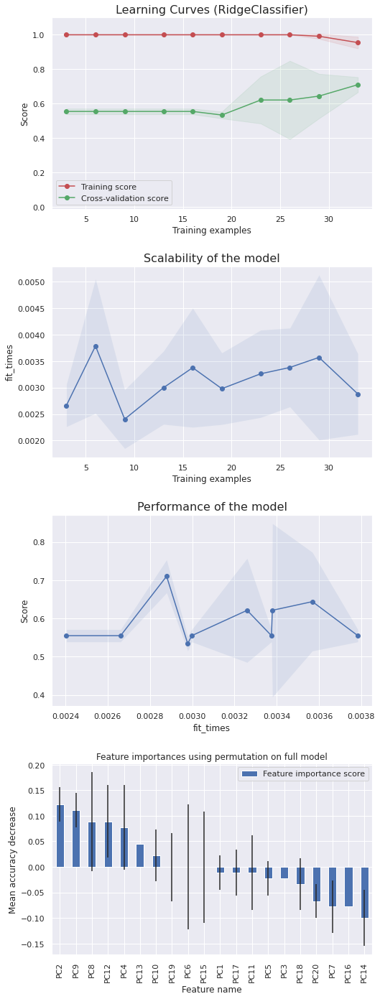




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.67,0.80,0.73,5.00
HCC,0.67,0.50,0.57,4.00
accuracy,0.67,0.67,0.67,0.67
macro avg,0.67,0.65,0.65,9.00
weighted avg,0.67,0.67,0.66,9.00


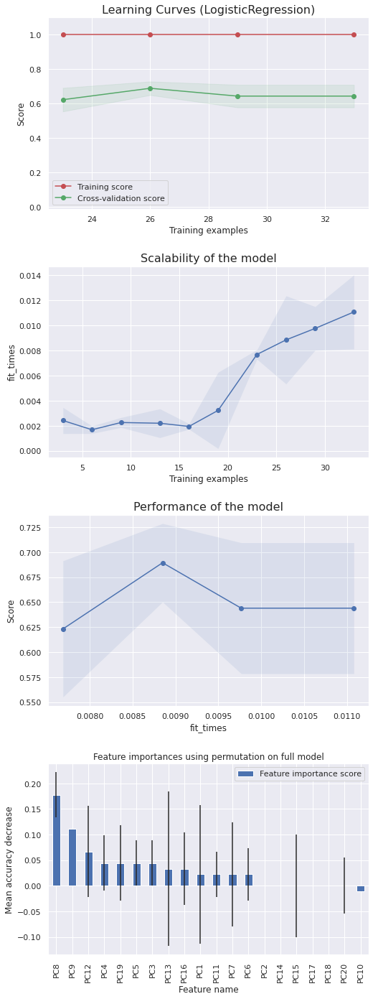




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,3,2
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.60,0.67,5.00
HCC,0.60,0.75,0.67,4.00
accuracy,0.67,0.67,0.67,0.67
macro avg,0.68,0.68,0.67,9.00
weighted avg,0.68,0.67,0.67,9.00


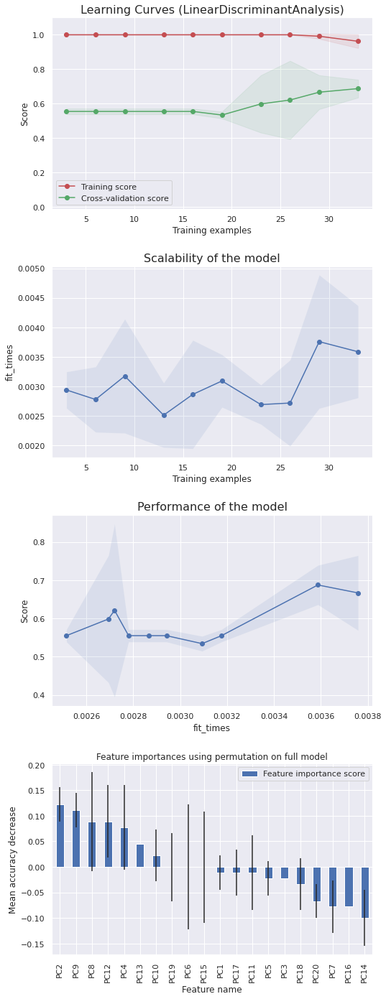




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


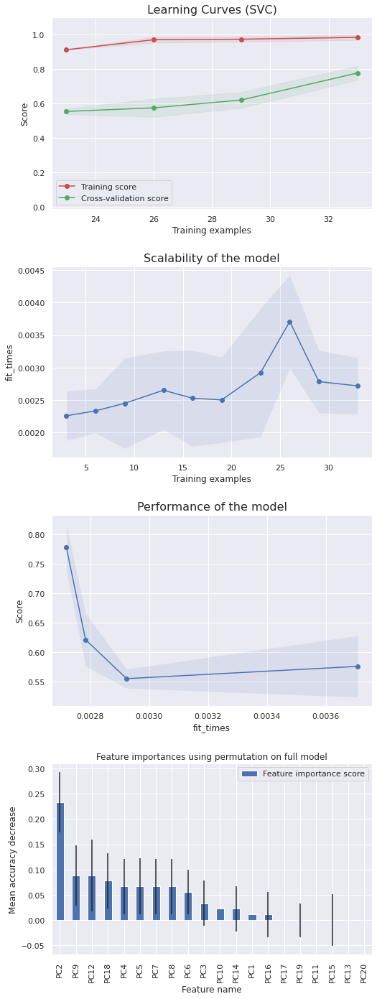




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,2,3
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.50,0.40,0.44,5.00
HCC,0.40,0.50,0.44,4.00
accuracy,0.44,0.44,0.44,0.44
macro avg,0.45,0.45,0.44,9.00
weighted avg,0.46,0.44,0.44,9.00


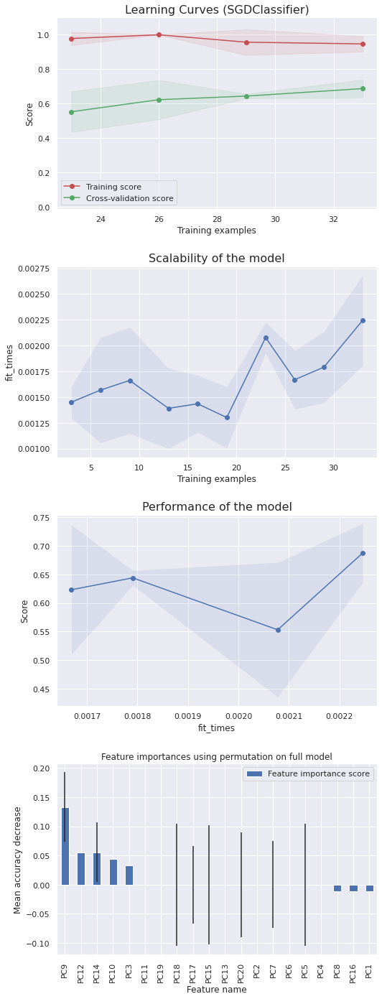




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 429, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 666, in score
    return accuracy_score(y, self.predict(X), sample_weight=sample_weight)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/neighbors/_classification.py", line 219, in predict
    neigh_ind = self.kneighbors(X, return_distance=False)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/neighbors/_base.py", line 749, in kneighbors
    raise ValueError(
Val

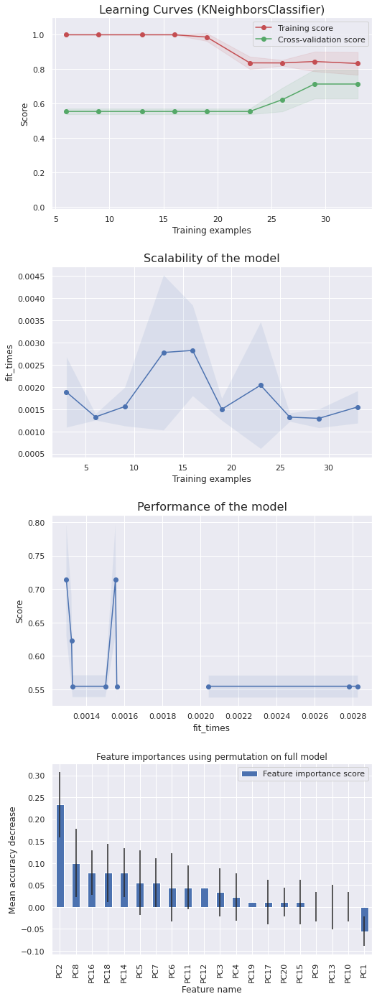




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


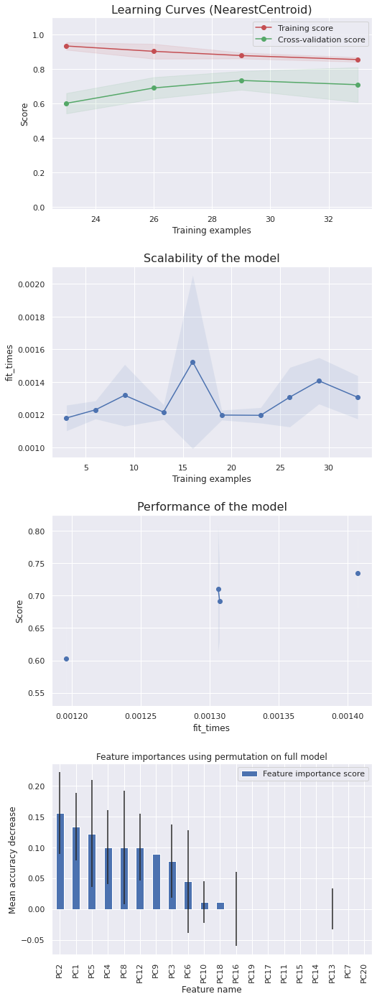




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


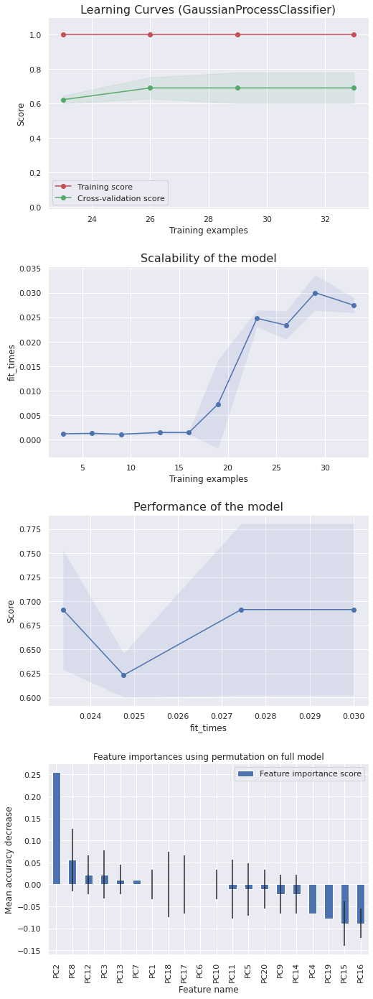




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,3,2
HCC,0,4



Classification report :


,precision,recall,f1-score,support
CRR,1.00,0.60,0.75,5.00
HCC,0.67,1.00,0.80,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.83,0.80,0.77,9.00
weighted avg,0.85,0.78,0.77,9.00


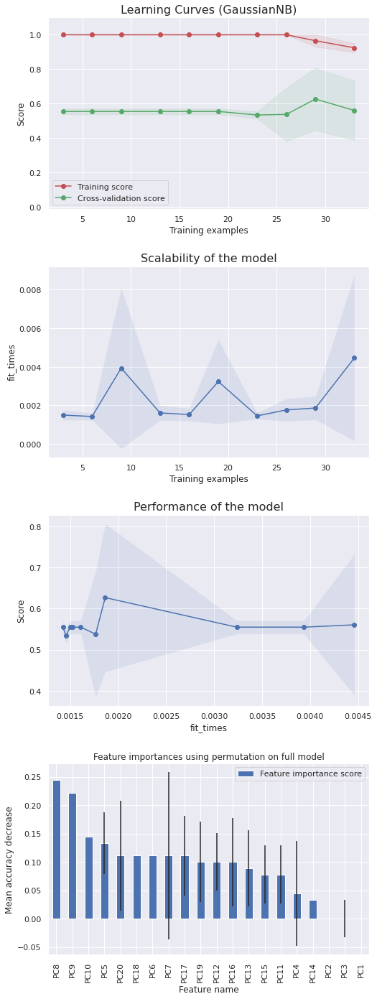




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,2,3
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.67,0.40,0.50,5.00
HCC,0.50,0.75,0.60,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.58,0.57,0.55,9.00
weighted avg,0.59,0.56,0.54,9.00


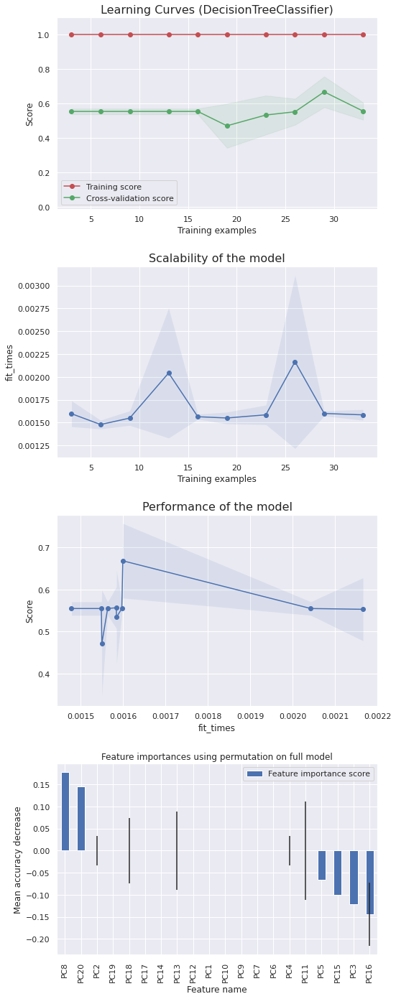




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,3,1



Classification report :


,precision,recall,f1-score,support
CRR,0.57,0.80,0.67,5.00
HCC,0.50,0.25,0.33,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.54,0.53,0.50,9.00
weighted avg,0.54,0.56,0.52,9.00


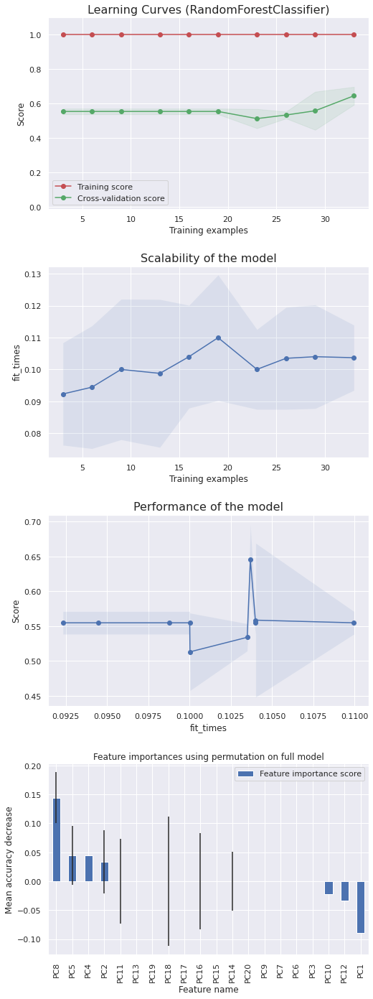




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,3,1



Classification report :


,precision,recall,f1-score,support
CRR,0.57,0.80,0.67,5.00
HCC,0.50,0.25,0.33,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.54,0.53,0.50,9.00
weighted avg,0.54,0.56,0.52,9.00


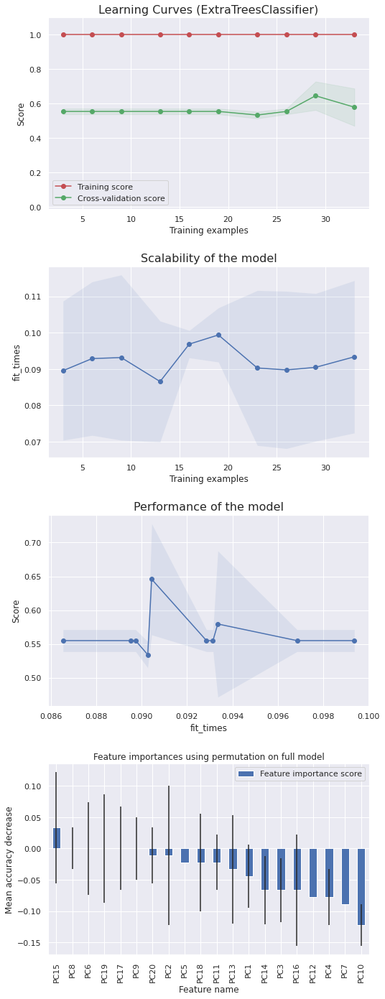




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.67,0.80,0.73,5.00
HCC,0.67,0.50,0.57,4.00
accuracy,0.67,0.67,0.67,0.67
macro avg,0.67,0.65,0.65,9.00
weighted avg,0.67,0.67,0.66,9.00


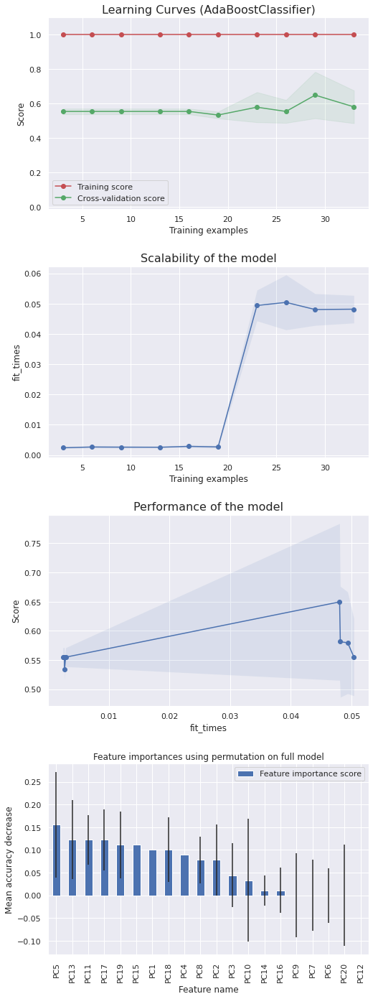




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,3,1



Classification report :


,precision,recall,f1-score,support
CRR,0.57,0.80,0.67,5.00
HCC,0.50,0.25,0.33,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.54,0.53,0.50,9.00
weighted avg,0.54,0.56,0.52,9.00


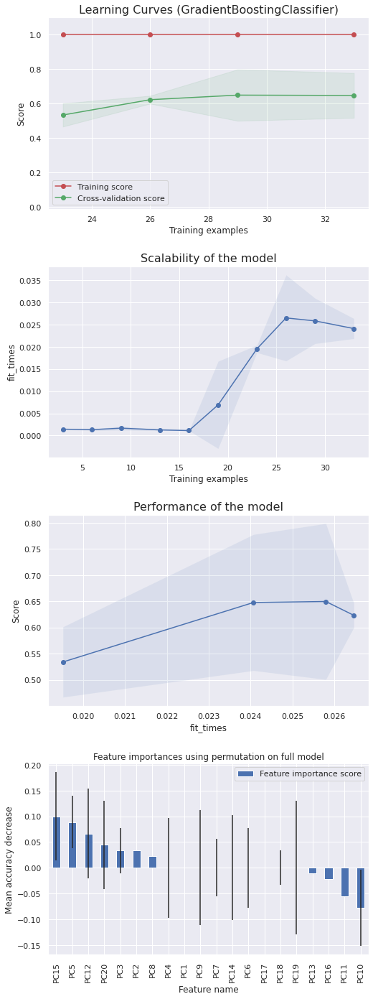




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,4,0



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
CRR,0.56,1.00,0.71,5.00
HCC,0.00,0.00,0.00,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.28,0.50,0.36,9.00
weighted avg,0.31,0.56,0.40,9.00


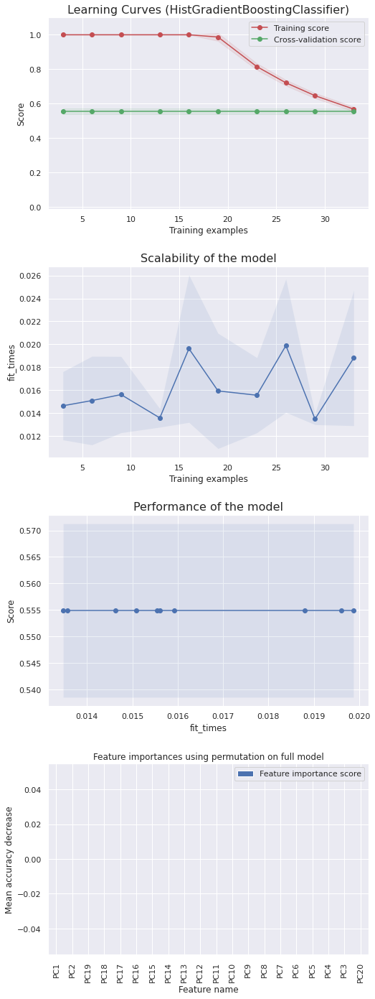




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,3,2
HCC,0,4



Classification report :


,precision,recall,f1-score,support
CRR,1.00,0.60,0.75,5.00
HCC,0.67,1.00,0.80,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.83,0.80,0.77,9.00
weighted avg,0.85,0.78,0.77,9.00


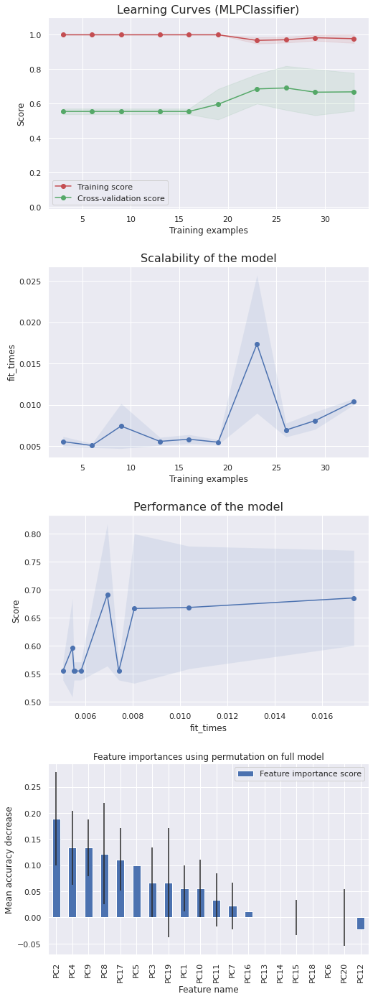




###################################################################################################################################################### 



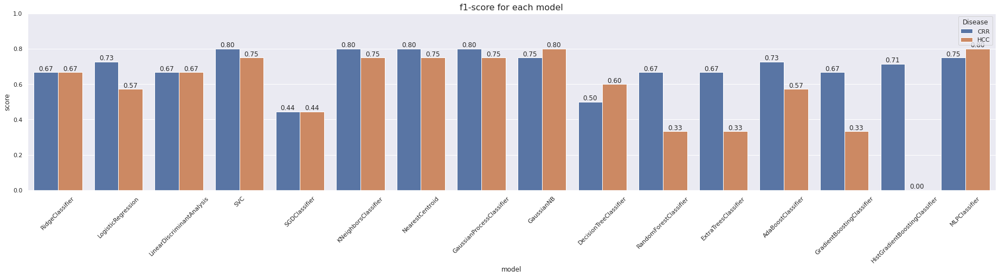


 ######################################################################################################################################################

Time to compute : 00h00m27s

 ######################################################################################################################################################






In [254]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_log_std_PCA, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True, score='f1-score')

In [255]:
print()

### with <code>X_imp_halfmin_log_std_fs_nb_10</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


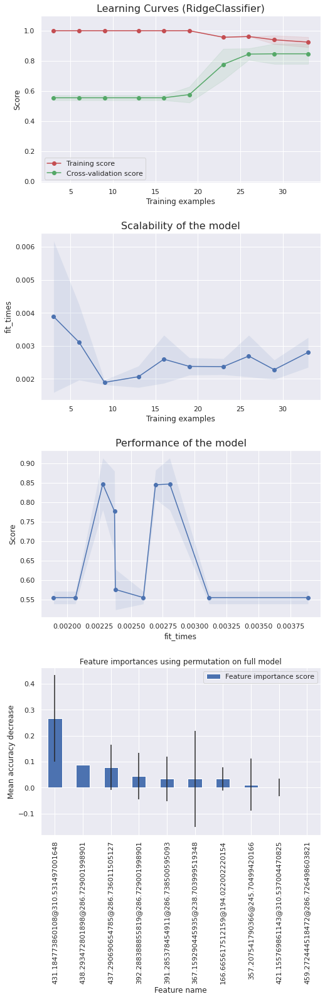




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


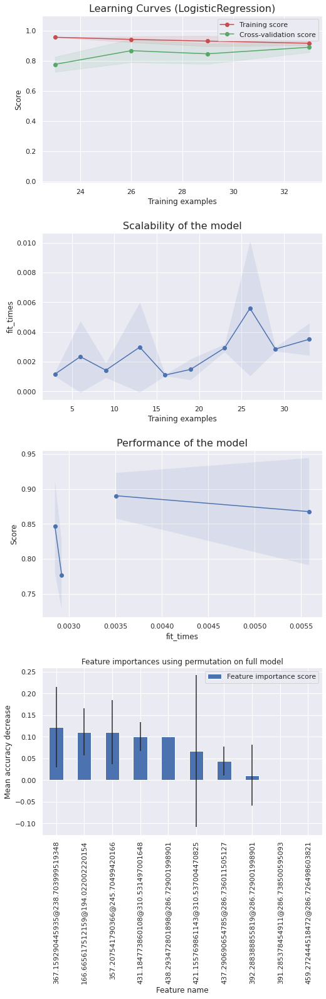




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.67,0.80,0.73,5.00
HCC,0.67,0.50,0.57,4.00
accuracy,0.67,0.67,0.67,0.67
macro avg,0.67,0.65,0.65,9.00
weighted avg,0.67,0.67,0.66,9.00


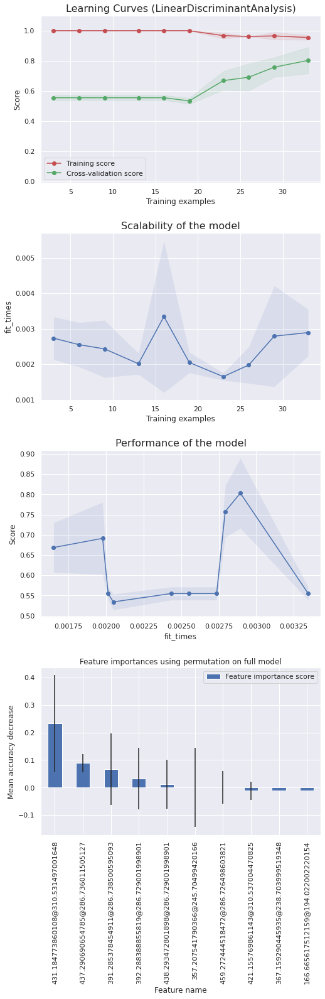




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


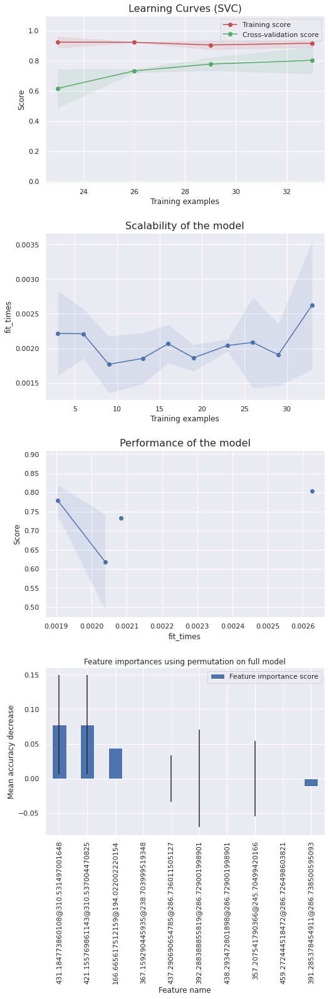




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,3,2
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.60,0.60,0.60,5.00
HCC,0.50,0.50,0.50,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.55,0.55,0.55,9.00
weighted avg,0.56,0.56,0.56,9.00


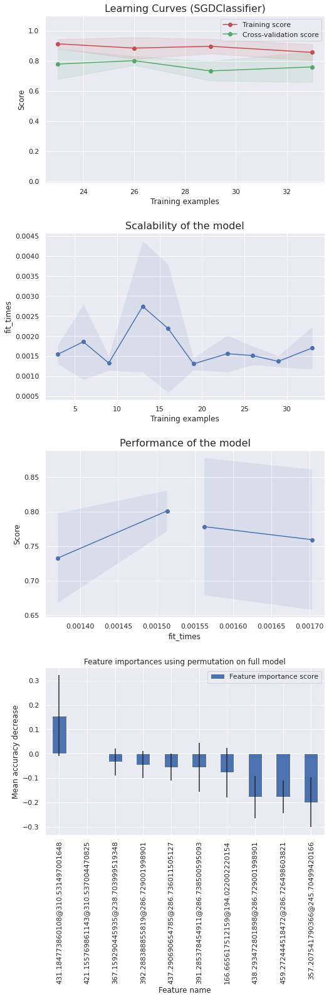




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 429, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 666, in score
    return accuracy_score(y, self.predict(X), sample_weight=sample_weight)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/neighbors/_classification.py", line 219, in predict
    neigh_ind = self.kneighbors(X, return_distance=False)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/neighbors/_base.py", line 749, in kneighbors
    raise ValueError(
Val

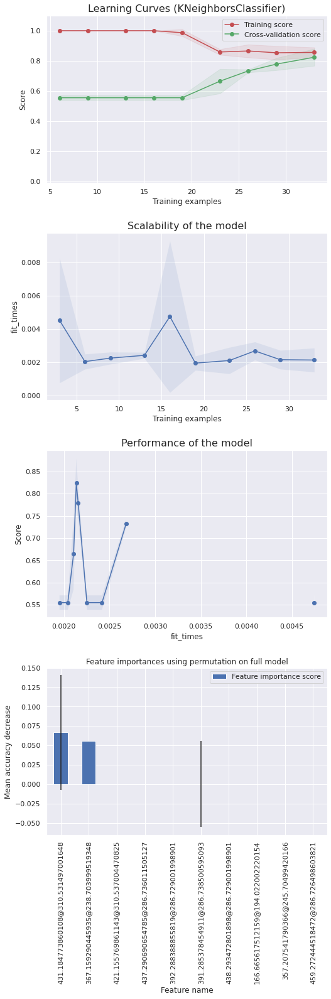




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


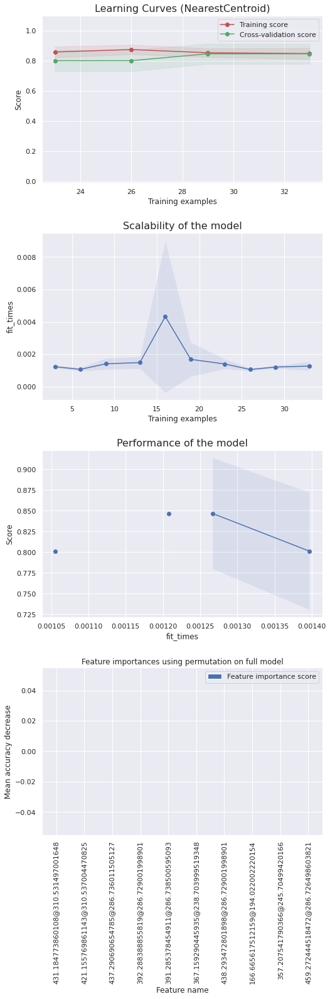




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


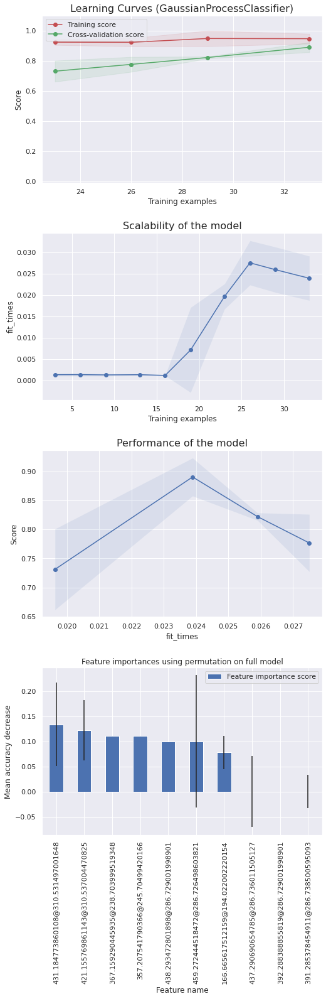




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


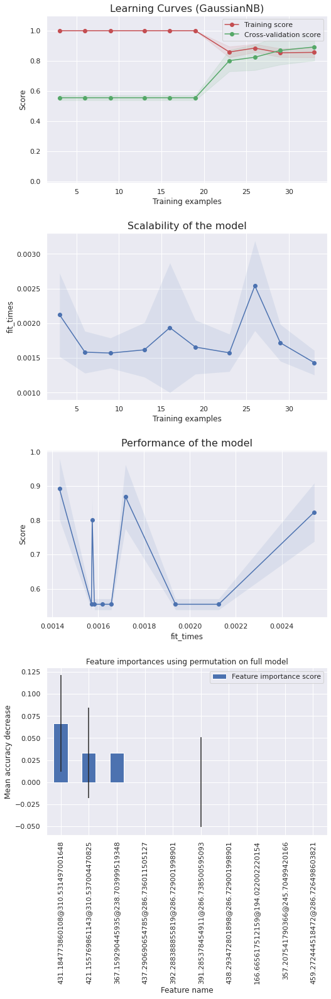




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


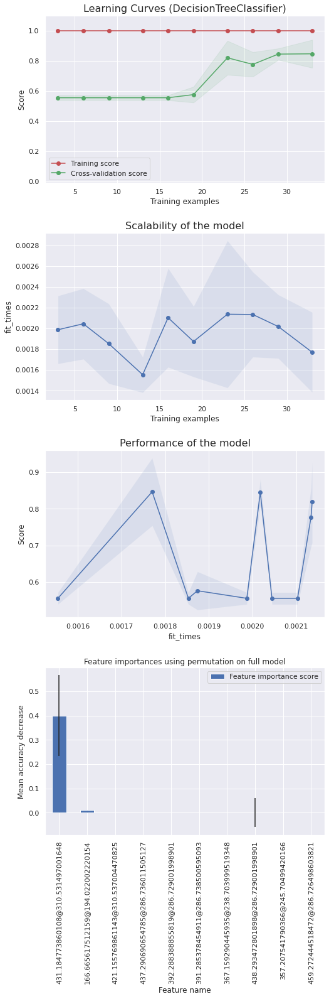




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.71,1.00,0.83,5.00
HCC,1.00,0.50,0.67,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.86,0.75,0.75,9.00
weighted avg,0.84,0.78,0.76,9.00


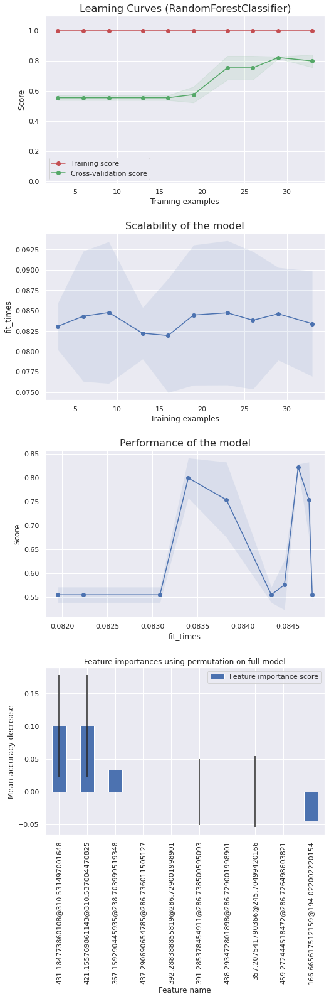




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


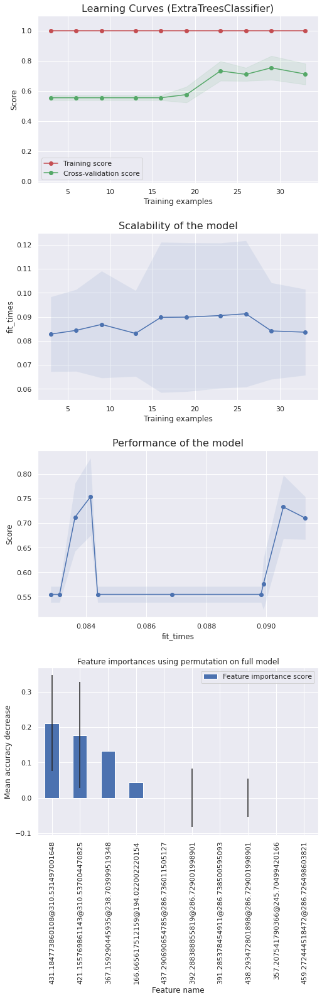




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.71,1.00,0.83,5.00
HCC,1.00,0.50,0.67,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.86,0.75,0.75,9.00
weighted avg,0.84,0.78,0.76,9.00


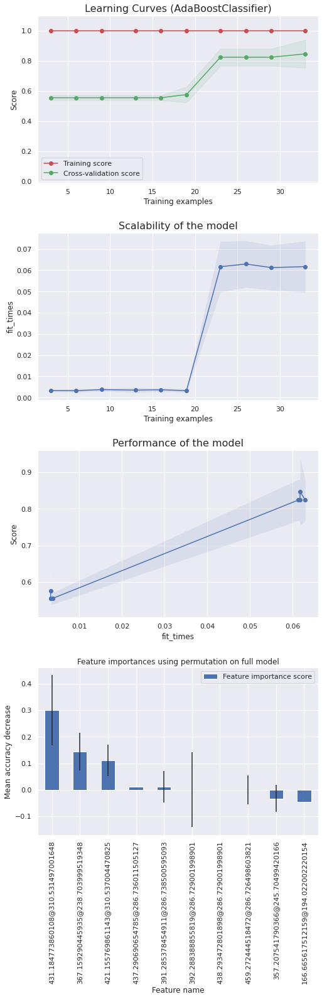




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


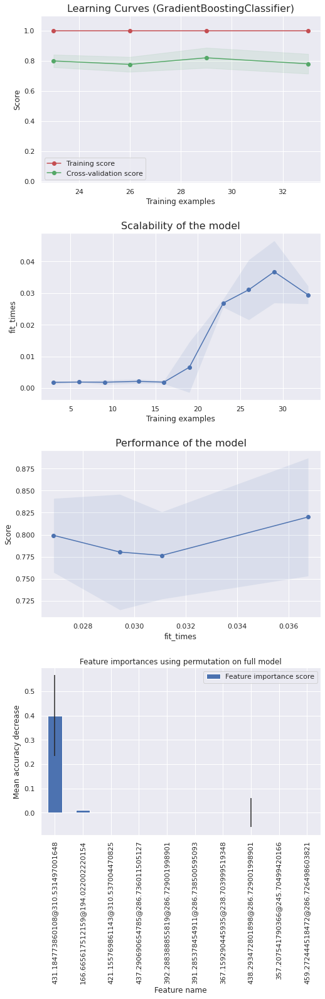




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,4,0



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
CRR,0.56,1.00,0.71,5.00
HCC,0.00,0.00,0.00,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.28,0.50,0.36,9.00
weighted avg,0.31,0.56,0.40,9.00


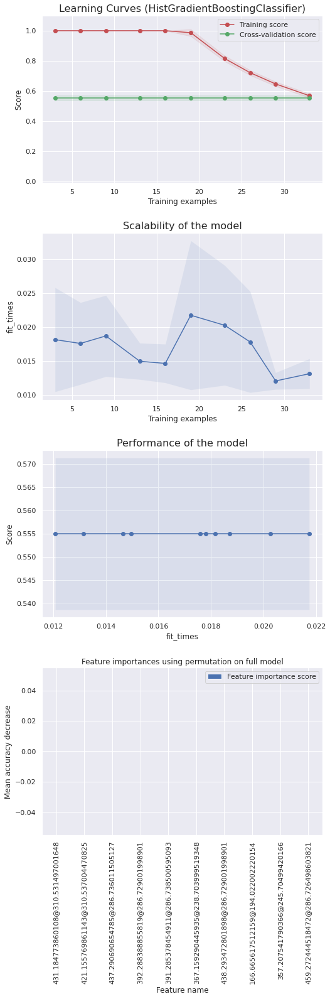




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,3,2
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.60,0.60,0.60,5.00
HCC,0.50,0.50,0.50,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.55,0.55,0.55,9.00
weighted avg,0.56,0.56,0.56,9.00


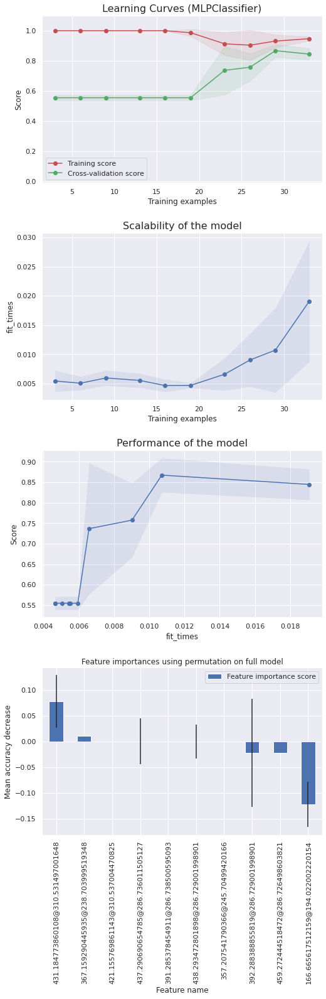




###################################################################################################################################################### 



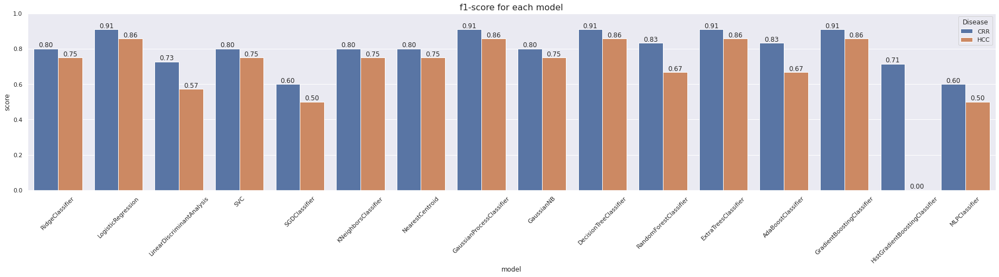


 ######################################################################################################################################################

Time to compute : 00h00m20s

 ######################################################################################################################################################






In [256]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_log_std_fs_nb_10, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True, score='f1-score')

In [257]:
print()

### with <code>X_imp_halfmin_log_std_fs_nb_5</code>

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



###################################################################################################################################################### 



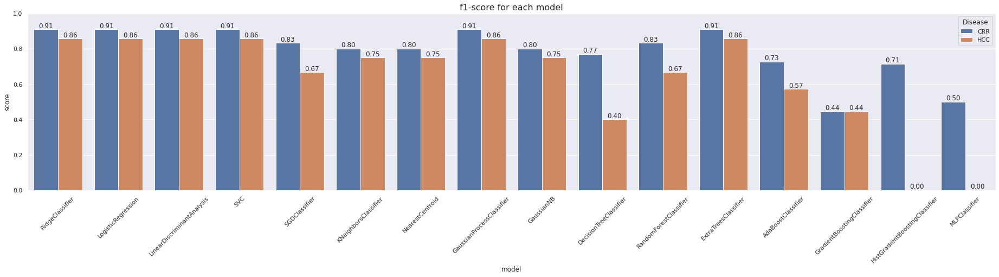


 ######################################################################################################################################################

Time to compute : 00h00m03s

 ######################################################################################################################################################






In [258]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_log_std_fs_nb_5, y=target,
                                                                dict_models=dict_models, plot_each_model=False, plot_hist_score=True, score='f1-score')

In [259]:
print()

### On the above barplot, we can choose a model and dig into its caracteristics, e.g. *RandomForestClassifier*

In [260]:
df_scores

,RidgeClassifier,LogisticRegression,LinearDiscriminantAnalysis,SVC,SGDClassifier,KNeighborsClassifier,NearestCentroid,GaussianProcessClassifier,GaussianNB,DecisionTreeClassifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoostClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,MLPClassifier
CRR,0.91,0.91,0.91,0.91,0.83,0.80,0.80,0.91,0.80,0.77,0.83,0.91,0.73,0.44,0.71,0.50
HCC,0.86,0.86,0.86,0.86,0.67,0.75,0.75,0.86,0.75,0.40,0.67,0.86,0.57,0.44,0.00,0.00


In [261]:
dict_df_feature_importance['DecisionTreeClassifier']

,Feature name,Feature importance score
0,431.184773860108@310.531497001648,0.06
1,421.155769861143@310.537004470825,0.04
2,437.290690654785@286.736011505127,0.00
3,392.288388855819@286.729001998901,0.00
4,391.285378454911@286.738500595093,-0.02


In [262]:
print()

### We can check in metadata if these features are identified

# 7 - Clustering

In [263]:
from clustering_functions import *

In [264]:
#target = peakTable['Disease']

## a - Kmeans

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



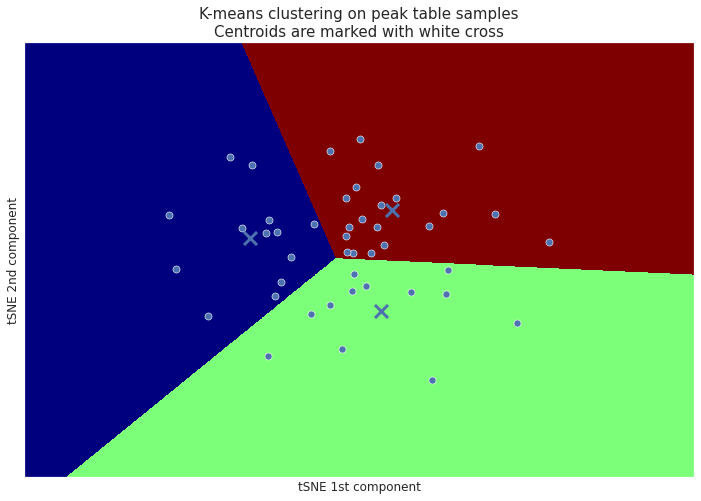

Inertia of k-means model : 13.58


In [265]:
kmeans = perform_kmeans(X_imp_halfmin_log_std_PCA_tSNE.astype('double'), n_clusters=3, col_prefix='tSNE')

## b - Affinity propagation

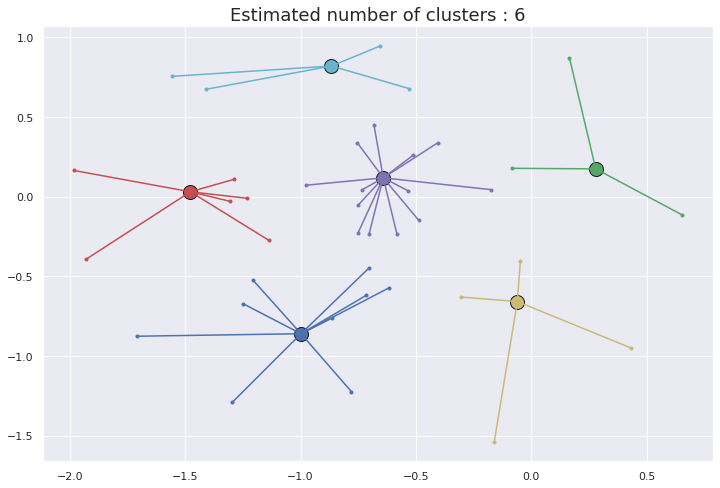

In [266]:
af = perform_affinity_propagation(X_imp_halfmin_log_std_PCA_tSNE)

## c - Hierarchical clustering

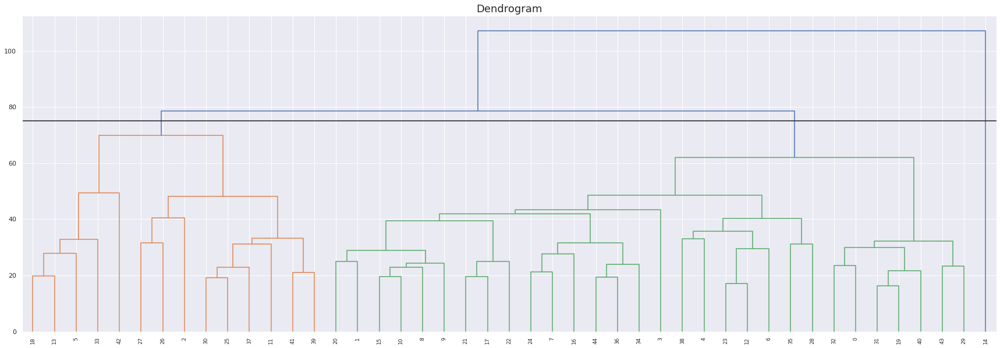

In [267]:
plot_dendrogram(X_imp_halfmin_log_std_PCA, hline=75)

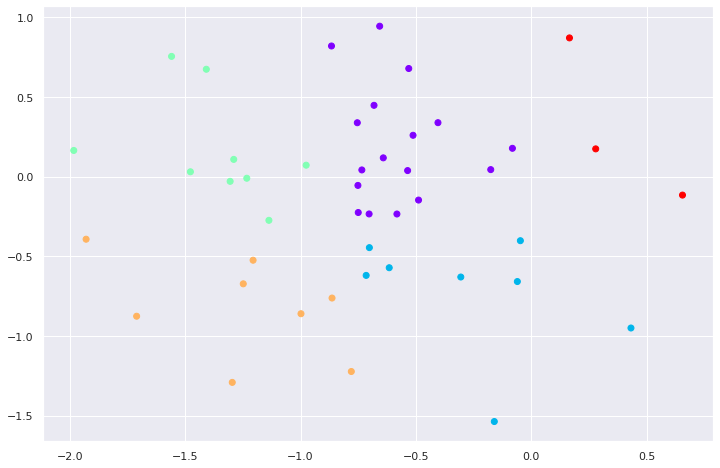

In [268]:
hc = perform_hierarchical_clustering(X_imp_halfmin_log_std_PCA_tSNE, n_clusters=5)